# Statistical Models for Healthcare Data

## Exam Project - Rotterdam Breast Cancer Study

**Author:** Anastasiia Samsonova  
**Course:** Statistical Models for Healthcare Data  
**Academic Year:** 2025-2026

**Overall aim:**
* Evaluate prognosis and treatment effects in breast cancer using observational cohort data.

**Specific objectives:**

1.	Identify key predictors of recurrence and mortality using classification models.

2.	Assess time-to-event dynamics through survival analysis.

3.	Estimate the causal effect of adjuvant hormonal therapy while accounting for confounding.

## Dataset Description

The dataset comprises 2982 primary breast cancer patients whose records were included in the Rotterdam tumour bank. The following variables have been collected:

Baseline clinical / pathological variables
* `pid`: patient identifier
* `age`: age at diagnosis (years)
* `year`: year of surgery
* `hospital_id`: id of the hospital where the patient was treated (1-25)
* `meno`: menopausal status (0= premenopausal, 1= postmenopausal)
* `nodes`: number of positive lymph nodes
* `size`: tumor size category (<=20, 20-50, >50 mm)
* `grade`: histological grade (1–3, higher grade indicates more severe disease)
* `er`: estrogen receptors (fmol/mg)
* `pgr`: progesterone receptors (fmol/mg)
* `hormon`: adjuvant hormonal therapy (1=yes, 0=no)
* `chemo`: adjuvant chemotherapy (1=yes, 0=no)

Time-to-event variables
* `rtime`: time from surgery to first recurrence or censoring (days)
* `recur`: recurrence indicator (1=recurrence, 0=censored)
* `dtime`: time from surgery to death or censoring (days)
* `death`: death indicator (1=death, 0=censored)

# Libraries

In [ ]:
!pip install lifelines -q
!pip install scikit-survival -q

In [ ]:
import os

In [ ]:
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import numpy as np
import math

In [ ]:
from sklearn.metrics import (
    roc_auc_score,
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    f1_score
)
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    StandardScaler,
    OneHotEncoder,
    OrdinalEncoder,
    PolynomialFeatures
)
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import (
    GridSearchCV,
    StratifiedKFold,
    KFold,
    cross_val_score
)
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.utils import resample

In [ ]:
import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess

In [ ]:
from lifelines import KaplanMeierFitter, CoxPHFitter
from sksurv.linear_model import CoxPHSurvivalAnalysis
from sksurv.util import Surv

In [ ]:
import scipy.stats as stats

In [ ]:
from tqdm.notebook import tqdm

In [ ]:
# constants
np.random.seed(42)
RANDOM_STATE = 42
TEST_SIZE = 0.2
PATH = '/content/drive/MyDrive/Labs/Statistical models/exam_project' # put here your path
FILE_NAME = 'rotterdam.csv' # put here file name if you change it

In [ ]:
pd.options.display.float_format = '{:,.4f}'.format

# 1. Data Loading and Dataset Check

## 1.1 Load data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv(os.path.join(PATH, FILE_NAME))

## 1.2 Data structure and summary

Missing values, data types, duplicates will be checked in this section.

In [ ]:
# first 5 rows of dataset
df.head()

,pid,year,age,hospital_id,meno,size,grade,nodes,pgr,er,hormon,chemo,rtime,recur,dtime,death
0,1,1992,74,16,1,<=20,3,0,35,291,0,0,1799,0,1799,0
1,2,1984,79,4,1,20-50,3,0,36,611,0,0,2828,0,2828,0
2,3,1983,44,2,0,<=20,2,0,138,0,0,0,6012,1,6012,0
3,4,1985,70,5,1,20-50,3,0,0,12,0,0,2624,0,2624,0
4,5,1983,75,17,1,<=20,3,0,260,409,0,0,4915,0,4915,0


In [ ]:
# last 5 rows of dataset
df.tail()

,pid,year,age,hospital_id,meno,size,grade,nodes,pgr,er,hormon,chemo,rtime,recur,dtime,death
2977,3003,1990,73,7,1,20-50,3,1,167,142,0,0,1990,1,1990,1
2978,3004,1987,75,0,1,>50,3,11,5,20,1,0,45,1,45,1
2979,3005,1985,79,2,1,20-50,3,6,189,21,0,0,582,0,582,1
2980,3006,1983,71,22,1,<=20,3,0,0,55,0,0,4972,0,4972,1
2981,3007,1993,68,2,1,<=20,3,12,0,0,1,0,379,1,379,1


Brief check of dataset:

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2982 entries, 0 to 2981
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   pid          2982 non-null   int64 
 1   year         2982 non-null   int64 
 2   age          2982 non-null   int64 
 3   hospital_id  2982 non-null   int64 
 4   meno         2982 non-null   int64 
 5   size         2982 non-null   object
 6   grade        2982 non-null   int64 
 7   nodes        2982 non-null   int64 
 8   pgr          2982 non-null   int64 
 9   er           2982 non-null   int64 
 10  hormon       2982 non-null   int64 
 11  chemo        2982 non-null   int64 
 12  rtime        2982 non-null   int64 
 13  recur        2982 non-null   int64 
 14  dtime        2982 non-null   int64 
 15  death        2982 non-null   int64 
dtypes: int64(15), object(1)
memory usage: 372.9+ KB


In [ ]:
df.describe()

,pid,year,age,hospital_id,meno,grade,nodes,pgr,er,hormon,chemo,rtime,recur,dtime,death
count,"2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000"
mean,"1,504.9547","1,988.1613",55.0584,5.9581,0.5600,2.7337,2.7123,161.8313,166.5895,0.1137,0.1945,"2,097.9038",0.4940,"2,605.3400",0.4266
std,868.3949,3.0355,12.9530,6.6915,0.4965,0.4421,4.3838,291.3111,272.4655,0.3175,0.3959,"1,397.7119",0.5000,"1,298.0776",0.4947
min,1.0000,"1,978.0000",24.0000,0.0000,0.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0000,36.0000,0.0000,36.0000,0.0000
25%,753.2500,"1,986.0000",45.0000,0.0000,0.0000,2.0000,0.0000,4.0000,11.0000,0.0000,0.0000,823.5000,0.0000,"1,607.0000",0.0000
50%,"1,504.5000","1,988.0000",54.0000,3.0000,1.0000,3.0000,1.0000,41.0000,61.0000,0.0000,0.0000,"1,940.0000",0.0000,"2,638.5000",0.0000
75%,"2,254.7500","1,990.0000",65.0000,10.0000,1.0000,3.0000,4.0000,198.0000,202.7500,0.0000,0.0000,"3,198.7500",1.0000,"3,554.7500",1.0000
max,"3,007.0000","1,993.0000",90.0000,24.0000,1.0000,3.0000,34.0000,"5,004.0000","3,275.0000",1.0000,1.0000,"7,043.0000",1.0000,"7,043.0000",1.0000


## 1.3 Missing values

In [ ]:
# missing values check
df.isna().sum()

,0
pid,0
year,0
age,0
hospital_id,0
meno,0
size,0
grade,0
nodes,0
pgr,0
er,0


No missing values.

## 1.4 Duplicates

In [ ]:
# explicit duplicates (all columns in df)
df.duplicated().sum()

np.int64(0)

In [ ]:
# implicit duplicates (df without 'hospital_id')
df.duplicated(subset=set(df.columns.tolist()) - set(['hospital_id'])).sum()

np.int64(0)

No duplicates observed.

## 1.5 Data type adjustments (EDA only)

What to do next:
* Variables `meno`, `hormon`, `chemo`, `recur`, `death` -> bool (for Exploratory Data Analysis only).
* `pid` -> index.
* Additional check of `size`, `grade`, `hospital_id` variable values is required to make sure that they have no improper values.

In [ ]:
# type convertation
col_to_bool = ['meno', 'hormon', 'chemo', 'recur', 'death']
df[col_to_bool] = df[col_to_bool].astype('bool')

In [ ]:
# index replacement by 'pid' values
if len(df) == len(df['pid'].unique()):
  df.set_index('pid', inplace=True)
  print('Index is replaced by "pid" column.')
else:
  print('Index cannot be replaced by "pid" column because the values in "pid" are not unique.')

Index is replaced by "pid" column.


In [ ]:
for i in ['size', 'grade', 'hospital_id']:
  # values in columns 'size', 'grade', 'hospital_id'
  display(df[[i]].value_counts(normalize=True))

,proportion
size,
<=20,0.4651
20-50,0.4329
>50,0.1019


,proportion
grade,
3,0.7337
2,0.2663


,proportion
hospital_id,
0,0.2746
1,0.1090
2,0.0765
3,0.0490
5,0.0490
6,0.0429
4,0.0386
7,0.0386
8,0.0335


`size` and `grade` are categorical and ordered variable with no additional improper values that have to be replaced.

`hospital_id` is categorical variable with no additional improper values that have to be replaced.

Variables `grade`, `hospital_id` -> str (for Exploratory Data Analysis only).

In [ ]:
# type convertation
col_to_str = ['grade', 'hospital_id']
df[col_to_str] = df[col_to_str].astype('str')

In [ ]:
# description of numerical variables
df.describe()

,year,age,nodes,pgr,er,rtime,dtime
count,"2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000","2,982.0000"
mean,"1,988.1613",55.0584,2.7123,161.8313,166.5895,"2,097.9038","2,605.3400"
std,3.0355,12.9530,4.3838,291.3111,272.4655,"1,397.7119","1,298.0776"
min,"1,978.0000",24.0000,0.0000,0.0000,0.0000,36.0000,36.0000
25%,"1,986.0000",45.0000,0.0000,4.0000,11.0000,823.5000,"1,607.0000"
50%,"1,988.0000",54.0000,1.0000,41.0000,61.0000,"1,940.0000","2,638.5000"
75%,"1,990.0000",65.0000,4.0000,198.0000,202.7500,"3,198.7500","3,554.7500"
max,"1,993.0000",90.0000,34.0000,"5,004.0000","3,275.0000","7,043.0000","7,043.0000"


In [ ]:
# description of non-numerical variables
df.select_dtypes(exclude=['int']).describe()

,hospital_id,meno,size,grade,hormon,chemo,recur,death
count,2982,2982,2982,2982,2982,2982,2982,2982
unique,25,2,3,2,2,2,2,2
top,0,True,<=20,3,False,False,False,False
freq,819,1670,1387,2188,2643,2402,1509,1710


In [ ]:
# final dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2982 entries, 1 to 3007
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   year         2982 non-null   int64 
 1   age          2982 non-null   int64 
 2   hospital_id  2982 non-null   object
 3   meno         2982 non-null   bool  
 4   size         2982 non-null   object
 5   grade        2982 non-null   object
 6   nodes        2982 non-null   int64 
 7   pgr          2982 non-null   int64 
 8   er           2982 non-null   int64 
 9   hormon       2982 non-null   bool  
 10  chemo        2982 non-null   bool  
 11  rtime        2982 non-null   int64 
 12  recur        2982 non-null   bool  
 13  dtime        2982 non-null   int64 
 14  death        2982 non-null   bool  
dtypes: bool(5), int64(7), object(3)
memory usage: 270.8+ KB


Categorical recoding is performed only for exploratory purposes. For modeling, original numeric encodings are retained.

# 2. Exploratory Data Analysis (EDA)

In [ ]:
# lists of variables
time_vars = ['rtime', 'dtime']
num_vars = list(set(df.select_dtypes(include=['int']).columns.tolist()) - set(time_vars))
target_vars = ['recur', 'death']
treatment_vars = ['chemo', 'hormon']
cat_vars = list(set(df.select_dtypes(exclude=['int']).columns.tolist()) - set(target_vars) - set(treatment_vars))

To avoid repetition, we will define helper functions for numerical and categorical EDA.

In [ ]:
def plot_num_distributions(df, variables, ncols=3, bins=30):
    """
    Plot histograms for numerical variables.
    """
    nrows = math.ceil(len(variables) / ncols)
    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axs = axs.flatten()

    for ax, var in zip(axs, variables):
        sns.histplot(
            data=df,
            x=var,
            bins=bins,
            kde=True,
            alpha=0.4,
            edgecolor="white",
            ax=ax
        )
        ax.set_title(f"Distribution of {var}")

    for ax in axs[len(variables):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_cat_distributions(df, variables, ncols=3, show_percent=True):
    """
    Plot countplots for categorical variables.
    """
    nrows = math.ceil(len(variables) / ncols)
    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axs = axs.flatten()

    for ax, var in zip(axs, variables):
        sns.countplot(data=df, x=var, alpha=0.8, ax=ax)
        ax.set_title(f"Distribution of {var}")
        ax.tick_params(axis='x', rotation=45)

        if show_percent:
            total = len(df)
            for p in ax.patches:
                height = p.get_height()
                percent = 100 * height / total
                ax.annotate(
                    f"{percent:.1f}%",
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=9
                )

    for ax in axs[len(variables):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

## 2.1 Distribution of baseline variables

### 2.1.1 Numerical variables

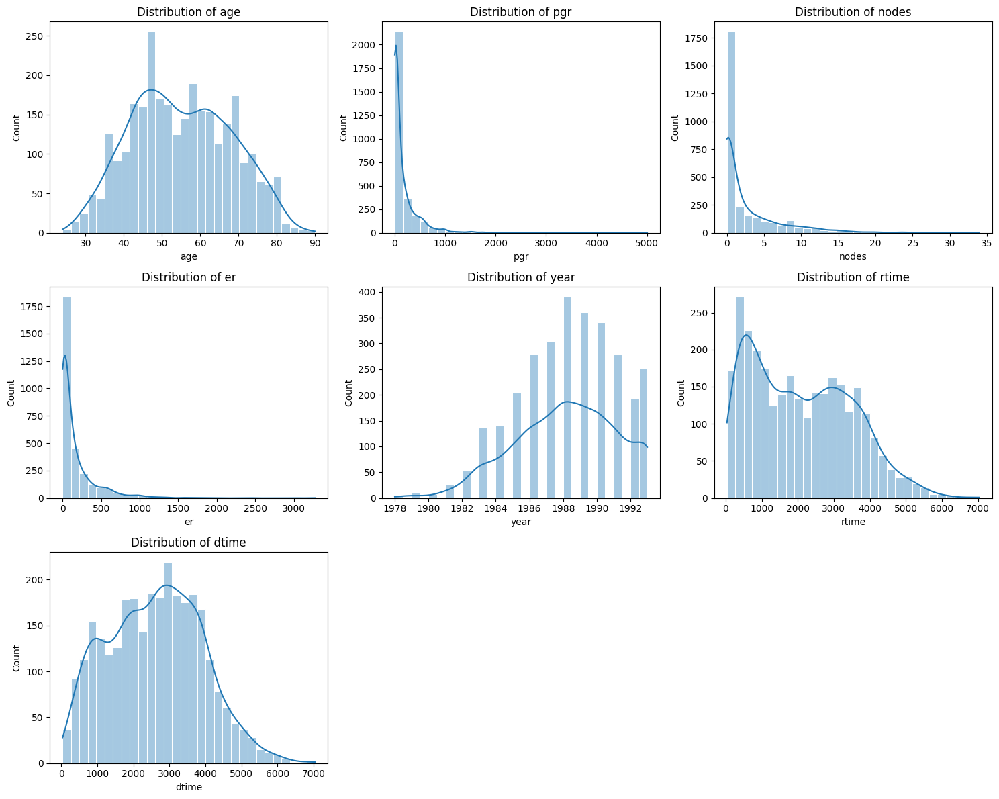

In [ ]:
# histograms for numeric variables
plot_num_distributions(df, num_vars+time_vars)

What is obsereved:
* `er`, `pgr`, `nodes` - distributions with long right tail that can tilt linear function during modelling.

### 2.1.2 Categorical variables

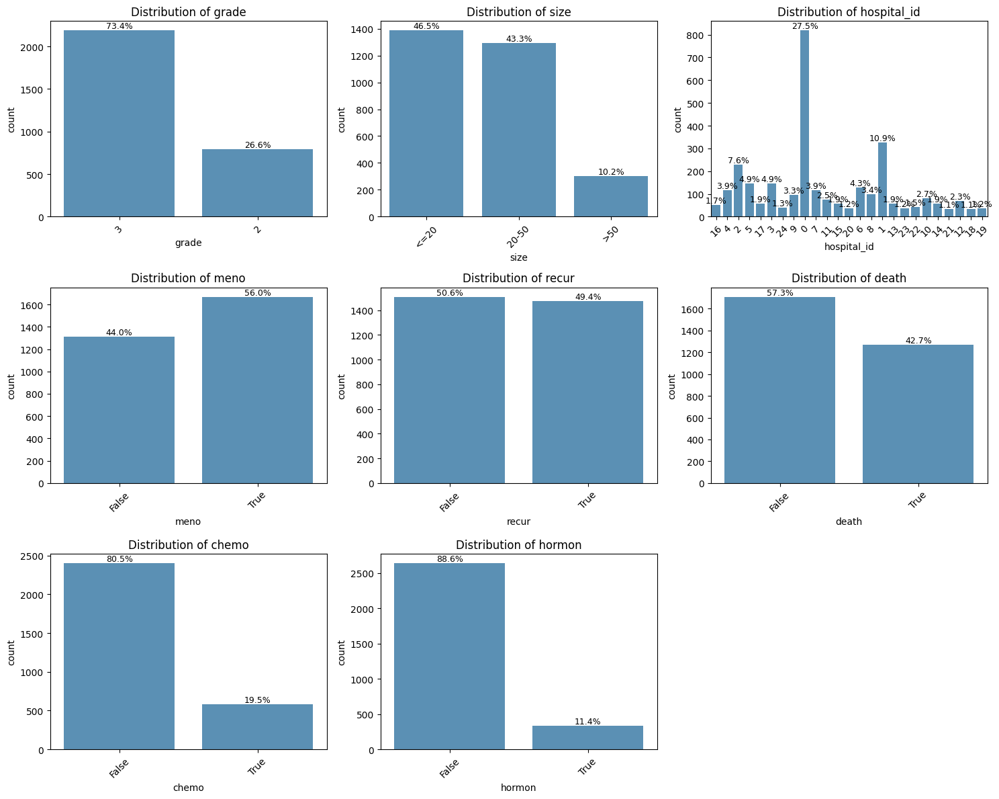

In [ ]:
# countplots for categorical variables
plot_cat_distributions(df, cat_vars+target_vars+treatment_vars)

What is obsereved:
* target variables (`recur` and `death`) are balanced.
* treatment variables (`chemo` and `hormon`) are not balanced: most of the patients didn't get treatment.
* patient counts per hospital vary substantially, with several centers contributing relatively small numbers of observations.

The dataset originates from a multicenter cohort comprising 25 hospitals. As a result, hospital-level effects are treated as potential sources of unobserved heterogeneity rather than as primary explanatory variables.

## 2.2 Derived Features

`er` and `pgr` -> add categorical vars (`er`: er-negative and er-positive, `pgr`: pgr-negative, pgr-positive) according to clinical standarts and dataset description.

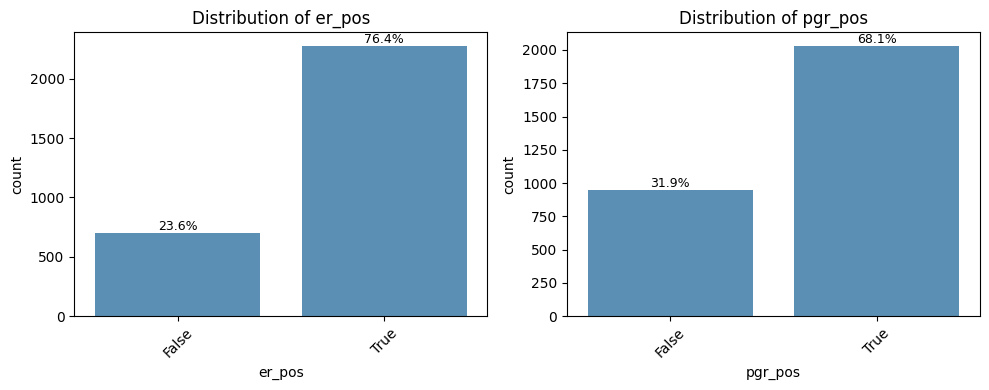

In [ ]:
# creating binary variable based on numerical ones
df['er_pos'] = df['er'] >= 10
df['pgr_pos'] = df['pgr'] >= 10

# list of added variables
added_cat_vars = ['er_pos', 'pgr_pos']

# countplots for added categorical variables
plot_cat_distributions(df, added_cat_vars, ncols=2)

`nodes` -> log-transform with offset because of long tail in distribution and due to clinical significance.

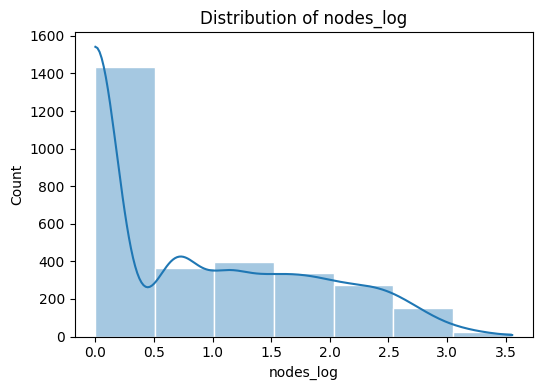

In [ ]:
# log transformation of nodes variable
df['nodes_log'] = np.log1p(df['nodes'])

# histogram for nodes_log variable
plot_num_distributions(df, ['nodes_log'], bins=7)

## 2.3 Exploratory Analysis Stratified by Outcome

In this section, baseline patient and tumor characteristics are explored
after stratification by clinical outcomes. This analysis provides insight into potential prognostic factors and informs subsequent modeling choices.

In [ ]:
def stratification_num_var(df, variables, stratification_var, ncols=3):
    """
    Plot boxplots stratified by one variable.
    """
    nrows = math.ceil(len(variables) / ncols)

    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axs = axs.flatten()

    for ax, var in zip(axs, variables):
        sns.boxplot(
            data=df,
            x=stratification_var,
            y=var,
            ax=ax
        )
        ax.set_title(f"{var} by {stratification_var} status")
        ax.set_xlabel(f"{stratification_var}")

    for ax in axs[len(variables):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_stacked_bar_percent(df, x, y, ax=None):
    """
    Plot stacked bar chart with percentages for a binary y.
    """
    # contingency table (row-normalized)
    ct = (
        pd.crosstab(df[x], df[y], normalize='index') * 100
    ).round(1)

    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 4))

    ct.plot(
        kind='bar',
        stacked=True,
        ax=ax
    )

    # add percentage labels
    for container in ax.containers:
        ax.bar_label(
            container,
            label_type='center',
            fmt='%.1f%%',
            fontsize=9
        )

    ax.set_ylabel("Percentage")
    ax.set_xlabel(x)
    ax.set_title(f"{y} distribution by {x}")
    ax.legend(title=y)


def stratification_cat_var(df, variables, stratification_var, ncols=3):
    """
    Plot barplots with percentages stratified by one variable.
    """
    nrows = math.ceil(len(variables) / ncols)

    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axs = axs.flatten()

    for ax, var in zip(axs, variables):
        plot_stacked_bar_percent(df, x=var, y=stratification_var, ax=ax)
        ax.set_title(f"{var} by {stratification_var} status")
        ax.tick_params(axis='x', rotation=45)

    for ax in axs[len(variables):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

In [ ]:
# updating variable lists
num_vars = num_vars+['nodes_log']
cat_vars = cat_vars+added_cat_vars

# creating list of categorical variables for stratification analysis
cat_vars_stratified_eda = cat_vars.copy()
cat_vars_stratified_eda.remove('hospital_id')

### 2.3.1 Stratification by Tumor Recurrence

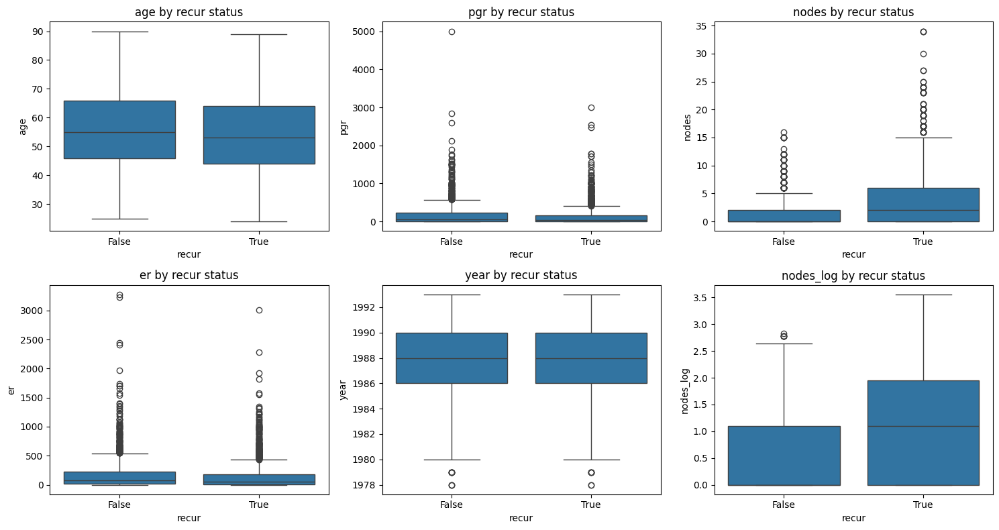

In [ ]:
# boxplots of num variables stratified by recur
stratification_num_var(df, num_vars, target_vars[0])

There is no big difference in recurrent status except `nodes` and `nodes_log` variables.

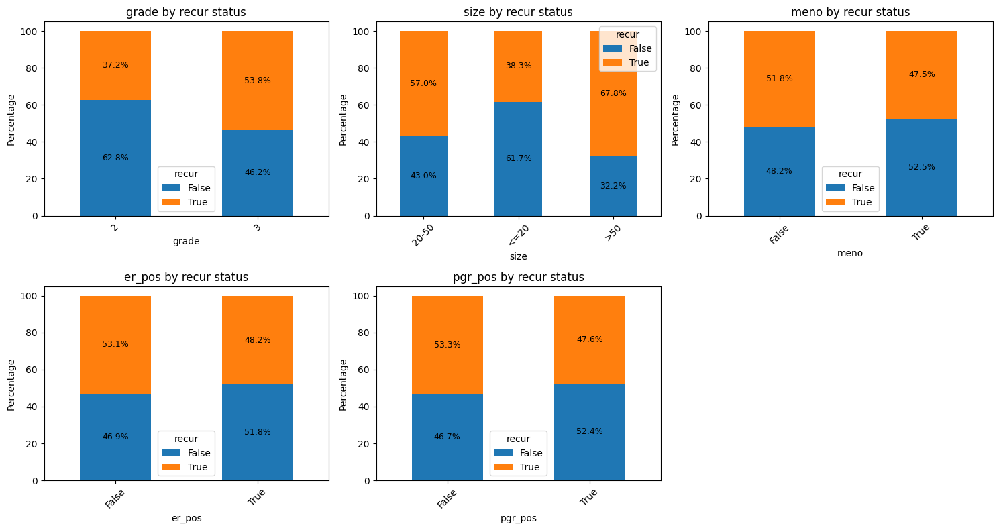

In [ ]:
# barlots of cat variables stratified by recur
stratification_cat_var(df, cat_vars_stratified_eda, target_vars[0])

Several baseline characteristics show visible differences when stratified by recurrence status. In particular, patients with recurrence tend to have a higher number of positive lymph nodes (`nodes` and `log_nodes` variables), more agressive (`grade`) and bigger in `size` tumor. It is consistent with known prognostic patterns in breast cancer. Proportions of recurrency in other variables are slightly different.

### 2.3.2 Stratification by Mortality

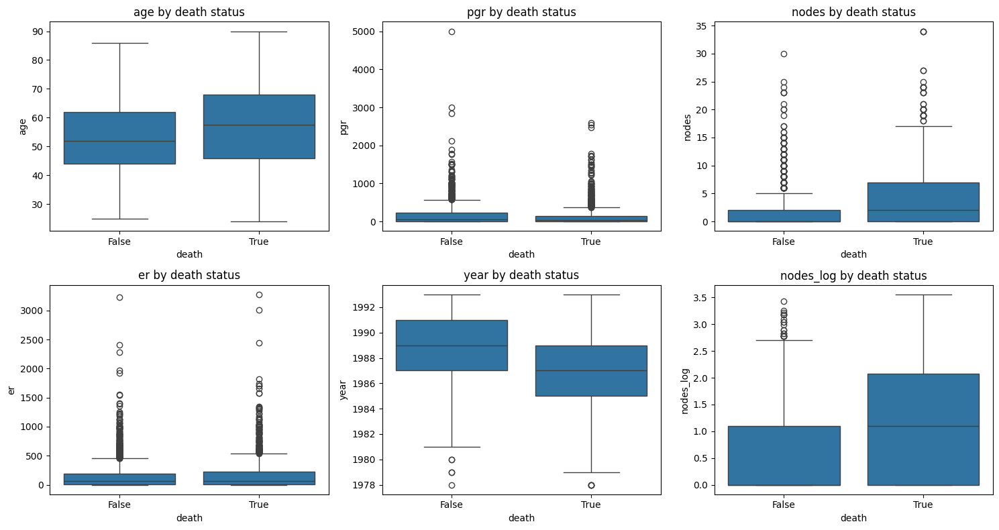

In [ ]:
# boxplots of num variables stratified by death
stratification_num_var(df, num_vars, target_vars[1])

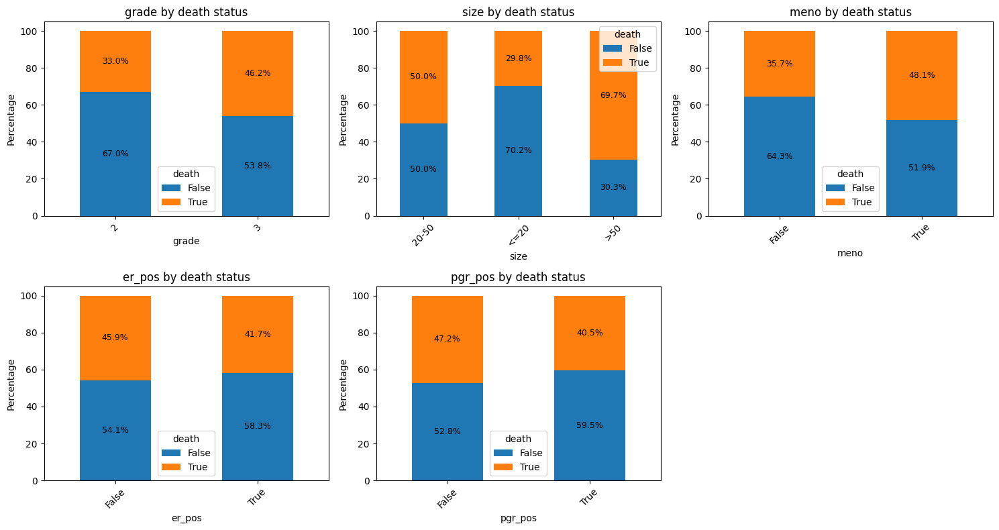

In [ ]:
# barlots of cat variables stratified by death
stratification_cat_var(df, cat_vars_stratified_eda, target_vars[1])

Stratification by mortality reveals patterns similar to those observed for recurrence. Higher tumor burden (more in `size` than in `grade`) and number of  positive lymph nodes (`nodes` and `log_nodes`) more frequent among deceased patients. The year of surgery appears to be slightly higher among surviving patients, which may reflect secular improvements in breast cancer management and supportive care over time.

Stratified exploratory analyses indicate that ER-positive (`er_pos`) and PGR-positive (`pgr_pos`) tumors are associated with lower mortality and, to a lesser extent, lower recurrence rates. These findings are consistent with established clinical evidence that hormone receptor positivity is a strong prognostic factor in breast cancer.

The stronger separation observed for mortality compared to recurrence may reflect the long-term benefits of endocrine therapy on overall survival, whereas recurrence is more strongly driven by tumor burden and biological aggressiveness.

The strong association between hormone receptor status, treatment assignment, and clinical outcomes underscores the need for methods capable of disentangling treatment effects from baseline prognostic differences. This motivates the causal inference framework adopted later in the analysis to estimate the effect of adjuvant hormonal therapy on recurrence and mortality.

## 2.4 Exploratory Analysis Stratified by Treatment

### 2.4.1 Stratification by Hormonal therapy

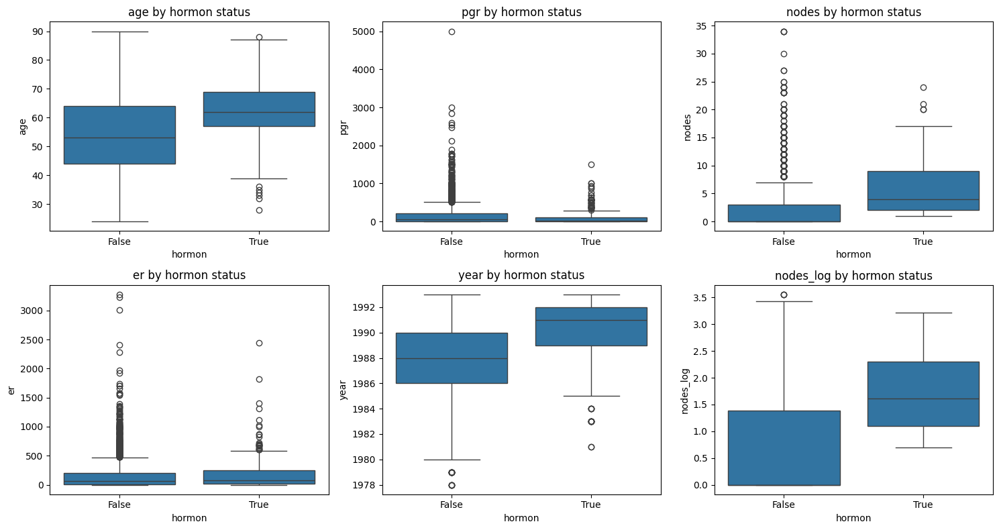

In [ ]:
# boxplots of num variables stratified by hormon
stratification_num_var(df, num_vars, treatment_vars[1])

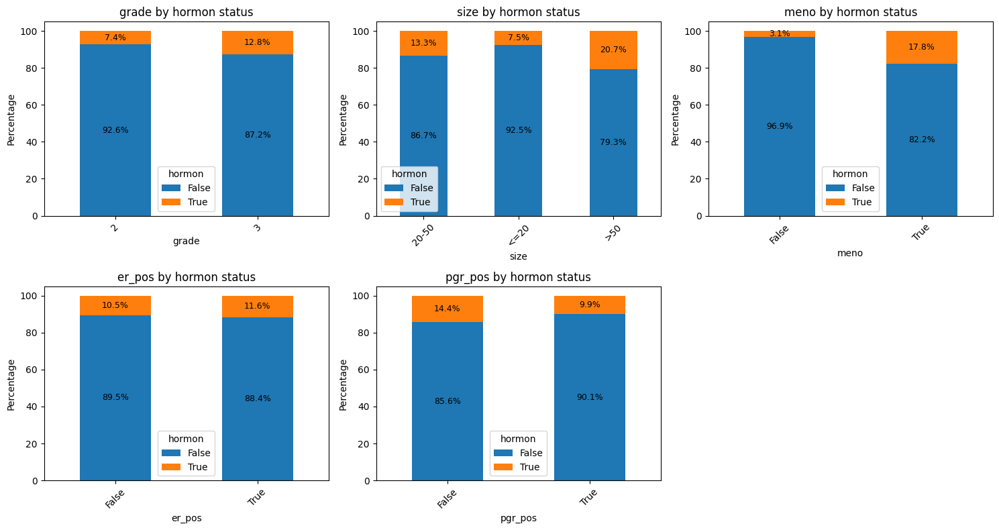

In [ ]:
# barlots of cat variables stratified by hormon
stratification_cat_var(df, cat_vars_stratified_eda, treatment_vars[1])

Stratified exploratory analyses indicate that the assignment of adjuvant hormonal therapy is non-random. Treatment was more frequently administered to older patients, those with larger and higher-grade tumors, postmenopausal women, patients with a higher number of positive lymph nodes, and individuals undergoing surgery in more recent calendar years. These patterns are consistent with clinical decision-making processes that consider both patient characteristics and disease severity.

Interestingly, no clear preferential assignment of hormonal therapy to ER-positive or PGR-positive patients is observed in the data. This apparent discrepancy likely reflects historical treatment practices and evolving biomarker-driven decision-making, as the cohort spans periods during which hormone receptor testing and its role in guiding endocrine therapy were less standardized than in current clinical practice. Consequently, hormone receptor status is treated primarily as a prognostic covariate rather than a strict determinant of treatment assignment in this analysis.

In [ ]:
# Select variables for baseline table
baseline_vars_cont = num_vars
baseline_vars_cat = list(set(cat_vars) - set(['hormon', 'hospital_id']))

# Helper functions
def summarize_continuous(df, var):
    return f"{df[var].median():.1f} [{df[var].quantile(0.25):.1f}, {df[var].quantile(0.75):.1f}]"

def summarize_categorical(df, var):
    counts = df[var].value_counts(normalize=True) * 100
    return counts.round(1).to_dict()

# Create table
groups = {
    'Overall': df,
    'Hormonal therapy: Yes': df[df['hormon'] == 1],
    'Hormonal therapy: No': df[df['hormon'] == 0]
}

table = {}

for group_name, group_df in groups.items():
    summary = {}
    for var in baseline_vars_cont:
        summary[var] = summarize_continuous(group_df, var)
    for var in baseline_vars_cat:
        summary[var] = summarize_categorical(group_df, var)
    table[group_name] = summary

baseline_table = pd.DataFrame(table)
baseline_table

,Overall,Hormonal therapy: Yes,Hormonal therapy: No
age,"54.0 [45.0, 65.0]","62.0 [57.0, 69.0]","53.0 [44.0, 64.0]"
pgr,"41.0 [4.0, 198.0]","19.0 [1.0, 115.0]","46.0 [5.0, 208.0]"
nodes,"1.0 [0.0, 4.0]","4.0 [2.0, 9.0]","0.0 [0.0, 3.0]"
er,"61.0 [11.0, 202.8]","79.0 [14.0, 247.5]","59.0 [11.0, 197.0]"
year,"1988.0 [1986.0, 1990.0]","1991.0 [1989.0, 1992.0]","1988.0 [1986.0, 1990.0]"
nodes_log,"0.7 [0.0, 1.6]","1.6 [1.1, 2.3]","0.0 [0.0, 1.4]"
grade,"{'3': 73.4, '2': 26.6}","{'3': 82.6, '2': 17.4}","{'3': 72.2, '2': 27.8}"
size,"{'<=20': 46.5, '20-50': 43.3, '>50': 10.2}","{'20-50': 50.7, '<=20': 30.7, '>50': 18.6}","{'<=20': 48.5, '20-50': 42.3, '>50': 9.1}"
er_pos,"{True: 76.4, False: 23.6}","{True: 78.2, False: 21.8}","{True: 76.2, False: 23.8}"
meno,"{True: 56.0, False: 44.0}","{True: 87.9, False: 12.1}","{True: 51.9, False: 48.1}"


In [ ]:
# baseline_table.to_excel('table_1.xlsx')

Table above was generated for report purpose.

### 2.4.2 Stratification by Chemo therapy

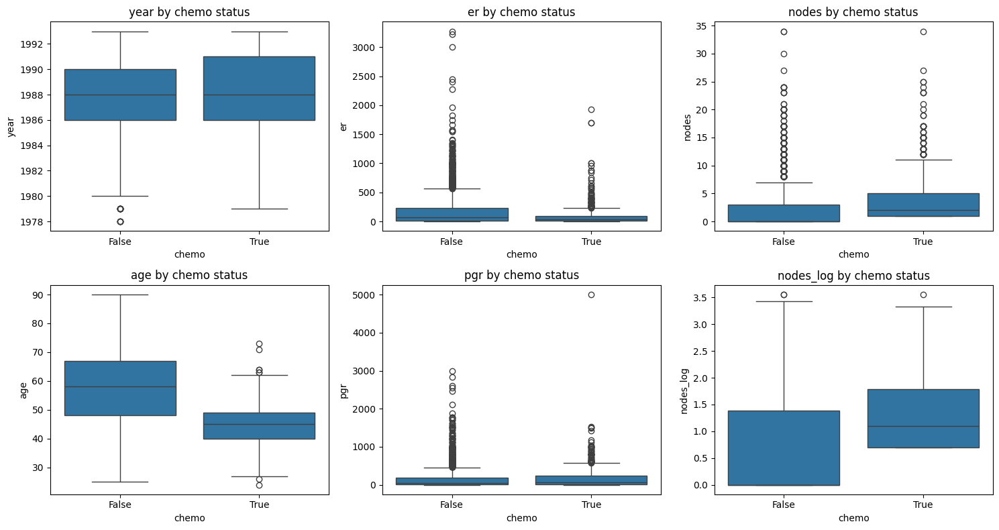

In [ ]:
# boxplots of num variables stratified by chemo
stratification_num_var(df, num_vars, treatment_vars[0])

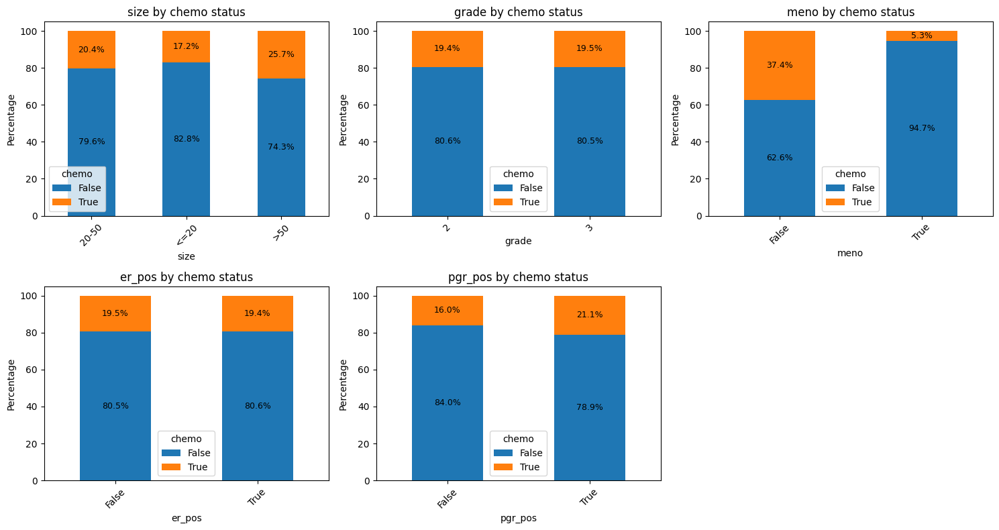

In [ ]:
# barlots of cat variables stratified by chemo
stratification_cat_var(df, cat_vars_stratified_eda, treatment_vars[0])

Stratified exploratory analyses indicate that the assignment of chemotherapy is non-random. Treatment was more frequently administered to younger patients, those with larger tumors, premenopausal women, patients with a higher number of positive lymph nodes.

## 2.5 Correlation and Multicollinearity Analysis

In [ ]:
# type convertation
df[col_to_bool+added_cat_vars+col_to_str] = df[col_to_bool+added_cat_vars+col_to_str].astype('int')

In [ ]:
# ordinal encoding of size for correlation analysis
size_order = {
    '<=20': 1,
    '20-50': 2,
    '>50': 3
}

df['size_ord'] = df['size'].map(size_order)

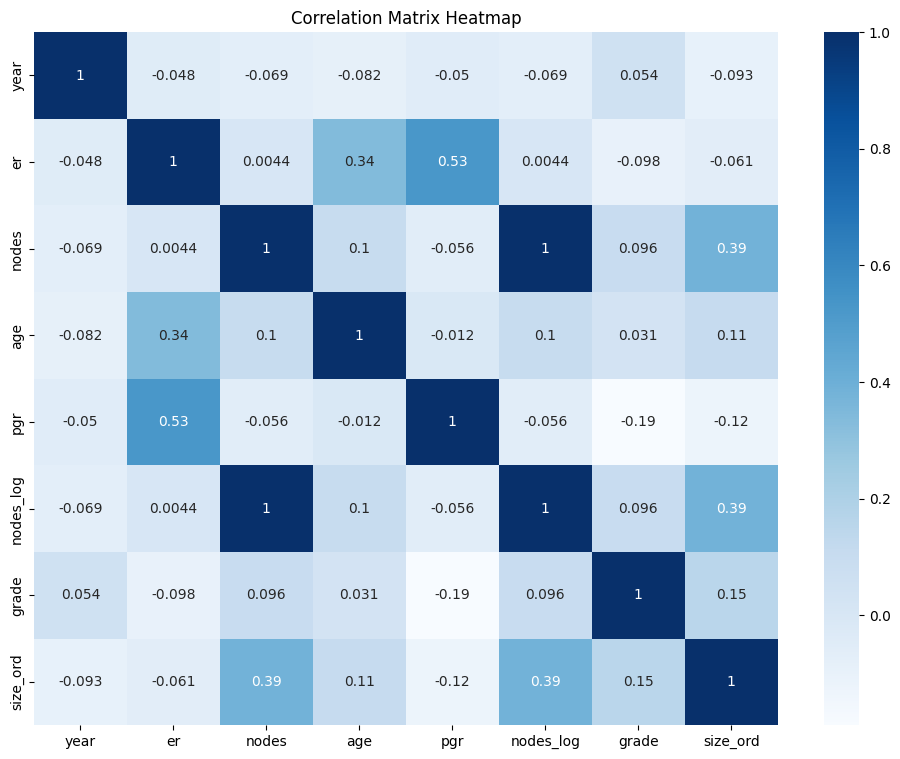

In [ ]:
# correlation of all numeric + ordinal variables
corr_vars = num_vars.copy() + ['grade', 'size_ord']

corr_matrix = df[corr_vars].corr(method='spearman')

plt.figure(figsize=(12,9))
sns.heatmap(corr_matrix, cmap="Blues",annot=True);
plt.title('Correlation Matrix Heatmap')
plt.show()

Correlation between continuous covariates was assessed using Spearman’s rank
correlation coefficient, given the non-normal and skewed distributions of several variables. A moderate correlation was observed between ER and PGR levels, reflecting their shared biological role in hormone receptor signaling. Moreover the proof of extremely high correlation between `nodes` and `log_nodes` was obsereved because it is a derived feature. As a result, care will be taken to avoid including highly correlated variables simultaneously in regression models to mitigate multicollinearity.

Given its ordinal nature, tumor grade was included in the correlation analysis using Spearman’s rank correlation coefficient. Moderate correlations between size of tumor and number of positive nodes reflect the shared association with tumor aggressiveness rather than redundancy.

# 3. Outcomes and Modeling Strategy

## 3.1 Definition of Outcomes

* `recur` - tumor recurrence (binary)
* `death` - death from any cause (binary)
* `rtime` - time to recurrence
* `dtime` - time to death or censoring

Two clinically relevant outcomes were considered in this analysis: tumor recurrence and overall mortality. Recurrence was defined as a binary variable indicating whether a patient experienced disease recurrence during follow-up, while mortality captured death from any cause. In addition, time-to-event information was available for both outcomes, enabling survival analysis with censoring.

## 3.2 Modeling Tasks Overview

Accordingly, two complementary modeling approaches were adopted. First, binary classification models will be used to assess the association between patient and tumor characteristics and the probability of recurrence or death. Second, time-to-event models will be employed to explicitly account for follow-up duration and censoring, providing a more complete description of disease progression.

In addition to association-based classification and survival models, a separate causal inference analysis is conducted in Section 6. That analysis explicitly focuses on estimating the causal effect of hormonal therapy using
propensity score-based methods and outcome regression under additional causal assumptions.

## 3.3 Classification Models

Logistic regression models will be used for binary outcomes (recurrence and death) due to their interpretability and widespread use in clinical research. Model coefficients will be interpreted in terms of odds ratios, facilitating clinical interpretation.

## 3.4 Survival Models

To incorporate information on follow-up time and censoring, Cox proportional hazards models will be fitted for both recurrence-free survival and overall survival. This approach allows estimation of hazard ratios while making minimal assumptions about the baseline hazard function.

## 3.5 Covariate Selection Strategy

Covariate selection was guided by clinical relevance, exploratory data analysis, and correlation diagnostics. Variables reflecting patient demographics, tumor burden, hormone receptor status, and treatment will be considered. Highly redundant features (e.g., raw and transformed versions of the same variable) will not be included simultaneously. Automated feature selection methods will be used only as supplementary analyses to assess model robustness.

## 3.6 Treatment Variables and Confounding Considerations

In the classification and survival models presented in Sections 4 and 5, treatment variables (chemotherapy and hormonal therapy) are included as adjustment covariates rather than as causal interventions, as treatment assignment was not randomized.

A formal causal interpretation of the effect of hormonal therapy is therefore not attempted within these models. Instead, causal effects are explicitly examined in a dedicated causal inference framework in Section 6.

## 3.7 Model Assumptions and Diagnostics (overview)

Model assumptions will be assessed where appropriate.

For logistic regression, linearity of continuous predictors on the log-odds scale will be evaluated, including consideration of non-linear age effects. Potential interaction terms between selected tumor-related variables (such as tumor `size` and `grade`) will be explored in classification models, motivated by clinical hypotheses.

For Cox models, the proportional hazards assumption will be examined using standard diagnostic methods.

## 3.8 Summary of Modeling Workflow

Overall, the modeling strategy integrates interpretable regression-based approaches with careful consideration of outcome definition, confounding, and model assumptions, providing a coherent framework for subsequent analyses.

## 3.9 Final List of Covariates for Each Model

### 3.9.1 Baseline Variables

Baseline (core clinical covariates):
* `age`
* `year`
* `meno`
* `size`
* `grade`
* `nodes_log`
* `er_pos`
* `pgr_pos`

Baseline covariates were selected to capture key patient characteristics, tumor burden, and biological features. These variables will be included consistently across models to ensure comparability of results.

### 3.9.2 Treatment Variables

Treatment-related covariates:
* `hormon`
* `chemo`

Treatment variables were included as adjustment covariates rather than causal interventions in the association-based models of Sections 4 and 5, reflecting the non-randomized nature of treatment assignment.

Causal effects of hormonal therapy are estimated separately using propensity score-based and outcome regression approaches in Section 6.

### 3.9.3 Logistic Regression Models

(A) Tumor Recurrence (Binary)

Primary model:
* Baseline covariates
* Treatment covariates

(B) Mortality (Binary)

Primary model:
* Baseline covariates
* Treatment covariates

Logistic regression models for tumor recurrence and mortality will include baseline clinical and tumor covariates, with additional models exploring non-linear age effects and selected interaction terms as sensitivity analyses.

### 3.9.4 Survival Models

(A) Recurrence-Free Survival (Cox)

Covariates:
* Baseline covariates
* Treatment covariates

(B) Overall Survival (Cox)

Covariates:
* Baseline covariates
* Treatment covariates

Cox proportional hazards models incorporated the same core covariates to model time-to-event outcomes while maintaining interpretability and adherence to proportional hazards assumptions.

### 3.9.5 Variables Not Included

Excluded variables
* `pid` — identifier only
* `nodes` — replaced by `nodes_log`
* `er` / `pgr` (continuous) — replaced by binary indicators
* `hospital_id`

Certain variables were excluded from modeling due to redundancy, lack of clinical interpretability, or unfavorable data characteristics.

In particular, hospital identifier was not included as a random effect despite the multicenter structure of the data. Given the relatively large number of hospitals relative to sample size. Hospital-level variability was treated as part of unexplained residual heterogeneity.

# 4. Classification Models

In [ ]:
def split_data(X, y):
    """
    Train/test split
    """
    return train_test_split(
        X,
        y,
        test_size=TEST_SIZE,
        random_state=RANDOM_STATE,
        stratify=y
    )

In [ ]:
def build_preprocessor(num_features, cat_features, ord_features):
    """
    Baseline variables preprocessing
    """
    grade_order = [1, 2, 3]
    size_order = ['<=20', '20-50', '>50']

    return ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), num_features),
            ('cat', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), cat_features),
            ('ord', OrdinalEncoder(categories=[size_order, grade_order]), ord_features)
        ]
    )

In [ ]:
def build_preprocessor_with_interactions(num_features, cat_features, ord_features, age_feature='age'):
    """
    Baseline variables + additional features preprocessing
    """
    grade_order = [1, 2, 3]
    size_order = ['<=20', '20-50', '>50']

    num_without_age = [f for f in num_features if f != age_feature]

    num_pipeline = Pipeline([
        ('scaler', StandardScaler())
    ])

    age_pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('poly', PolynomialFeatures(degree=2,
                                    include_bias=False))
    ])

    ord_pipeline = Pipeline([
        ('ord', OrdinalEncoder(categories=[size_order, grade_order])),
        ('interaction', PolynomialFeatures(degree=2,
                                           interaction_only=True,
                                           include_bias=False))
    ])

    return ColumnTransformer(
        transformers=[
            ('num', num_pipeline, num_without_age),
            ('age', age_pipeline, [age_feature]),
            ('cat', OneHotEncoder(drop='first',
                                  handle_unknown='ignore',
                                  sparse_output=False), cat_features),
            ('ord', ord_pipeline, ord_features)
        ]
    )

In [ ]:
def build_logistic_pipeline(preprocessor, C=1.0):
    """
    Pipeline with preprocessor and Logistic Regression
    """
    model = LogisticRegression(
        C=C, # C = 1.0 is default
        penalty='l2', # default
        solver='liblinear', # works good for relatively small dataset in binary classification models
        max_iter=1000,
        random_state=RANDOM_STATE
    )

    return Pipeline(
        steps=[
            ('preprocessor', preprocessor),
            ('model', model)
        ]
    )

In [ ]:
def evaluate_classifier(model, X, y, threshold=0.5): # we will modify threshold later
    """
    Evaluate a binary classification model.

    Returns a dictionary with main performance metrics.
    """
    y_proba = model.predict_proba(X)[:, 1]
    y_pred = (y_proba >= threshold).astype(int)

    results = {
        'roc_auc': roc_auc_score(y, y_proba),
        'accuracy': accuracy_score(y, y_pred),
        'confusion_matrix': confusion_matrix(y, y_pred),
        'classification_report': classification_report(y, y_pred, output_dict=True)
    }

    return results

In [ ]:
def tune_logistic_model(
    pipeline,
    X,
    y,
    param_grid,
    scoring='roc_auc',
    n_splits=5
):
    """
    Tuning parameters of Logistic Regression
    """
    cv = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=RANDOM_STATE
    )

    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        scoring=scoring,
        cv=cv,
        n_jobs=-1,
        refit=True
    )

    grid_search.fit(X, y)

    return grid_search

In [ ]:
def print_main_metrics(results):
    """
    Print results of evaluate_classifier function
    """
    print(f"Model: {results['model_name']}")
    print("Train ROC-AUC:", round(results['train']['roc_auc'], 3))
    print("Test  ROC-AUC:", round(results['test']['roc_auc'], 3))
    print("Train Accuracy:", round(results['train']['accuracy'], 3))
    print("Test  Accuracy:", round(results['test']['accuracy'], 3))

In [ ]:
def find_threshold_by_recall(y_true, y_proba, min_recall=0.8):
    """
    Find best threshold for classification model
    with fixed min_recall
    """
    thresholds = np.linspace(0.01, 0.99, 99)
    candidates = []

    for t in thresholds:
        y_pred = (y_proba >= t).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

        if recall >= min_recall:
            candidates.append({
                'threshold': t,
                'recall': recall,
                'specificity': specificity
            })

    if not candidates:
        return None

    return max(candidates, key=lambda x: x['specificity'])

In [ ]:
def evaluate_with_threshold(model, X, y, threshold=0.5, target_names=None):
    """
    Print classification report and confusion matrix
    for a given probability threshold.
    """
    y_proba = model.predict_proba(X)[:, 1]
    y_pred = (y_proba >= threshold).astype(int)

    print(f"Decision threshold: {threshold:.3f}\n")

    print("Classification report:")
    print(
        classification_report(
            y,
            y_pred,
            target_names=target_names,
            digits=3
        )
    )

    cm = confusion_matrix(y, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=target_names, yticklabels=target_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:
def plot_roc_with_threshold(model, X, y, threshold=None, label=None):
    """
    Plot ROC curve and optionally highlight a chosen threshold.
    """
    y_proba = model.predict_proba(X)[:, 1]

    fpr, tpr, thresholds = roc_curve(y, y_proba)
    roc_auc = roc_auc_score(y, y_proba)

    plt.figure(figsize=(6, 6))
    plt.plot(
        fpr,
        tpr,
        label=label or f'ROC curve (AUC = {roc_auc:.3f})'
    )
    plt.plot([0, 1], [0, 1], linestyle='--')

    if threshold is not None:
        # Find closest threshold on ROC curve
        idx = (np.abs(thresholds - threshold)).argmin()
        plt.scatter(
            fpr[idx],
            tpr[idx],
            s=80,
            marker='o',
            edgecolor='black',
            label=f'Threshold = {threshold:.2f}'
        )

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

## 4.1 Recurrence prediction

### 4.1.1 Baseline model

In [ ]:
num_features = ['age', 'year', 'nodes_log']
cat_features = ['meno', 'er_pos', 'pgr_pos', 'hormon', 'chemo']
ord_features = ['size', 'grade']

X = df[num_features + cat_features + ord_features]
y_recur = df[target_vars[0]]

X_train, X_test, y_train, y_test = split_data(X, y_recur)

preprocessor = build_preprocessor(
    num_features=num_features,
    cat_features=cat_features,
    ord_features=ord_features
)

baseline_model = build_logistic_pipeline(
    preprocessor=preprocessor
)

baseline_model.fit(X_train, y_train)

baseline_results = {
    'model_name': 'Logistic Regression (baseline)',
    'train': evaluate_classifier(baseline_model, X_train, y_train),
    'test': evaluate_classifier(baseline_model, X_test, y_test)
}

print_main_metrics(baseline_results)

Model: Logistic Regression (baseline)
Train ROC-AUC: 0.7
Test  ROC-AUC: 0.743
Train Accuracy: 0.646
Test  Accuracy: 0.68


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


A baseline logistic regression model was fitted using predefined clinical and tumor covariates without hyperparameter tuning. Model performance was evaluated on both the training and test sets using ROC-AUC as the primary metric. This baseline serves as a reference point for subsequent model extensions and regularization.

### 4.1.2 Regularized model

In [ ]:
param_grid = {
    'model__C': np.logspace(-5, 3, 10)
}

grid_search = tune_logistic_model(
    pipeline=baseline_model,
    X=X_train,
    y=y_train,
    param_grid=param_grid,
    scoring='roc_auc'
)

best_model = grid_search.best_estimator_
best_C = grid_search.best_params_['model__C']

print("Best C:", best_C)
print("Best CV ROC-AUC:", round(grid_search.best_score_, 3))

regularized_results = {
    'model_name': 'Logistic Regression (L2 regularized)',
    'best_C': best_C,
    'cv_roc_auc': grid_search.best_score_,
    'train': evaluate_classifier(best_model, X_train, y_train),
    'test': evaluate_classifier(best_model, X_test, y_test)
}

print_main_metrics(regularized_results)

Best C: 2.154434690031882
Best CV ROC-AUC: 0.694
Model: Logistic Regression (L2 regularized)
Train ROC-AUC: 0.7
Test  ROC-AUC: 0.744
Train Accuracy: 0.646
Test  Accuracy: 0.677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Regularization did not improve predictive performance compared to the baseline model. This suggests that the baseline specification was already stable and not strongly affected by overfitting.

### 4.1.3 Feature Engineering

In [ ]:
preprocessor_fe = build_preprocessor_with_interactions(
    num_features=num_features,
    cat_features=cat_features,
    ord_features=ord_features,
    age_feature='age'
)

regularized_model_fe = build_logistic_pipeline(
    preprocessor=preprocessor_fe,
    C=best_C
)

regularized_model_fe.fit(X_train, y_train)

regularized_results_fe = {
    'model_name': 'Logistic Regression (L2 regularized) - Feature Engineering',
    'train': evaluate_classifier(regularized_model_fe, X_train, y_train),
    'test': evaluate_classifier(regularized_model_fe, X_test, y_test)
}

print_main_metrics(regularized_results_fe)

Model: Logistic Regression (L2 regularized) - Feature Engineering
Train ROC-AUC: 0.701
Test  ROC-AUC: 0.745
Train Accuracy: 0.649
Test  Accuracy: 0.678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


### 4.1.4 Feature Selection (SFS)

In [ ]:
regularized_model = LogisticRegression(
    C=best_C,
    penalty='l2',
    solver='liblinear',
    max_iter=1000,
    random_state=RANDOM_STATE
)

X_train_transformed = preprocessor_fe.fit_transform(X_train)
X_test_transformed = preprocessor_fe.transform(X_test)

# selecting features using SequentialFeatureSelector
sfs = SequentialFeatureSelector(
    estimator=regularized_model,
    n_features_to_select="auto",
    direction="backward",
    scoring="roc_auc",
    cv=5,
    n_jobs=-1
)

sfs.fit(X_train_transformed, y_train)

feature_names = preprocessor_fe.get_feature_names_out()
selected_mask = sfs.get_support()
selected_features = feature_names[selected_mask]

print('Selected features', selected_features)

Selected features ['num__nodes_log' 'age__age' 'cat__hormon_1' 'cat__chemo_1' 'ord__size'
 'ord__grade']


In [ ]:
X_train_sel = X_train_transformed[:, selected_mask]
X_test_sel = X_test_transformed[:, selected_mask]

# fitting model with selected features
regularized_model.fit(X_train_sel, y_train)

regularized_results_fs = {
    'model_name': 'Logistic Regression (L2 regularized) - Feature Selection',
    'train': evaluate_classifier(regularized_model, X_train_sel, y_train),
    'test': evaluate_classifier(regularized_model, X_test_sel, y_test)
}

print_main_metrics(regularized_results_fs)

Model: Logistic Regression (L2 regularized) - Feature Selection
Train ROC-AUC: 0.7
Test  ROC-AUC: 0.744
Train Accuracy: 0.646
Test  Accuracy: 0.677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Feature selection resulted in a more parsimonious model without loss of predictive performance (test ROC-AUC = 0.744).

### 4.1.5 Final hyperparameter tuning

Final tuning after features selection.

In [ ]:
param_grid = {
    'C': np.logspace(-5, 3, 10)
}

grid_search = tune_logistic_model(
    pipeline=regularized_model,
    X=X_train_sel,
    y=y_train,
    param_grid=param_grid,
    scoring='roc_auc'
)

best_model = grid_search.best_estimator_
best_C = grid_search.best_params_['C']

print("Best C:", best_C)
print("Best CV ROC-AUC:", round(grid_search.best_score_, 3))

regularized_results = {
    'model_name': 'Logistic Regression (L2 regularized)',
    'best_C': best_C,
    'cv_roc_auc': grid_search.best_score_,
    'train': evaluate_classifier(best_model, X_train_sel, y_train),
    'test': evaluate_classifier(best_model, X_test_sel, y_test)
}

print_main_metrics(regularized_results)

Best C: 129.15496650148827
Best CV ROC-AUC: 0.697
Model: Logistic Regression (L2 regularized)
Train ROC-AUC: 0.7
Test  ROC-AUC: 0.745
Train Accuracy: 0.645
Test  Accuracy: 0.677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Hyperparameter tuning of the regularization strength after feature selection resulted in a slightly higher optimal value of C; however, this did not lead to a meaningful improvement in test ROC-AUC. Given the negligible difference in performance, we retained the more regularized model (C = 2.15) as the final predictive model to favor stability and generalizability.

### 4.1.6 Threshold selection

In a clinical decision-support setting, the cost of missing a true recurrence case is typically higher than the cost of a false positive prediction. Therefore, instead of using the default classification threshold of 0.5, the decision threshold will be selected by prioritizing recall (sensitivity) for the recurrence class.

In [ ]:
y_train_proba = regularized_model.predict_proba(X_train_sel)[:, 1]

# selecting the most suitable threshold on training set
best_threshold_recall = find_threshold_by_recall(
    y_train,
    y_train_proba,
    min_recall=0.8
)

print(best_threshold_recall)

{'threshold': np.float64(0.38), 'recall': np.float64(0.801358234295416), 'specificity': np.float64(0.4142502071251036)}


The threshold was optimized to 0.38 on the training set to ensure a high ability to identify patients with recurrence (recur = 1), allowing the model to flag high-risk patients for closer clinical monitoring or further diagnostic assessment.

Decision threshold: 0.380

Classification report:
               precision    recall  f1-score   support

No recurrence      0.747     0.440     0.554       302
   Recurrence      0.597     0.847     0.700       295

     accuracy                          0.642       597
    macro avg      0.672     0.644     0.627       597
 weighted avg      0.673     0.642     0.626       597



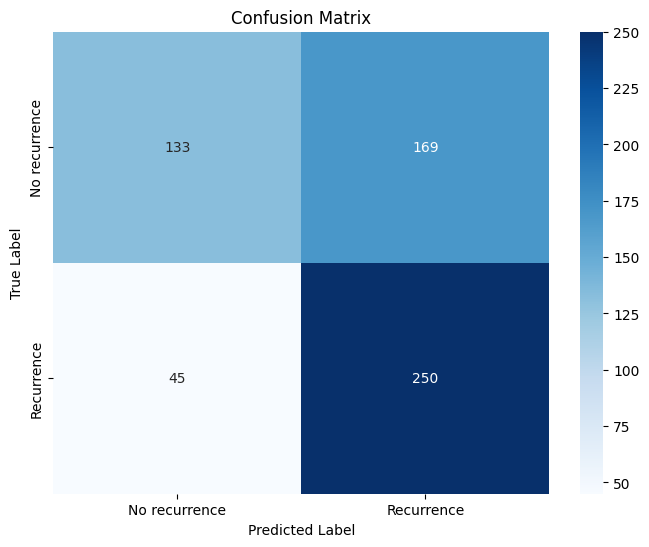

In [ ]:
# applying selected threshold to test set
evaluate_with_threshold(
    model=regularized_model,
    X=X_test_sel,
    y=y_test,
    threshold=best_threshold_recall['threshold'],
    target_names=['No recurrence', 'Recurrence']
)

The model achieves a recall of 0.847 for recurrence, successfully identifying the majority of high-risk patients. This improvement in sensitivity comes at the cost of reduced precision and overall accuracy, which is an expected and acceptable trade-off in a clinical risk screening context.

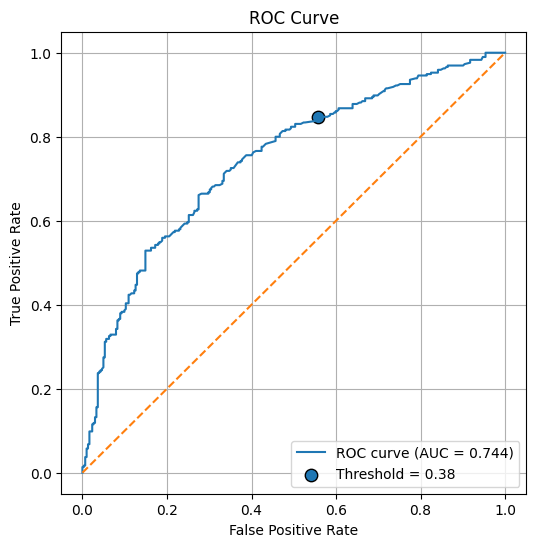

In [ ]:
plot_roc_with_threshold(
    model=regularized_model,
    X=X_test_sel,
    y=y_test,
    threshold=best_threshold_recall['threshold']
)

### 4.1.7 Logistic Regression Assumptions

Logistic regression assumes a binary outcome, independence of observations, correct model specification with linearity in the logit for continuous predictors, absence of strong multicollinearity, and an adequate sample size.

These assumptions were assessed through study design considerations (each observation corresponds to a unique patient, target is binary variable), feature transformations, encoding strategies, and model diagnostics.

Assumptions specific to linear regression, such as normality and homoscedasticity of residuals, are not required for logistic regression models.

### 4.1.8 Inference analysis

To complement the predictive analysis, we will fit a logistic regression model using statsmodels to assess the statistical association between predictors and recurrence.

This analysis is observational and identifies statistical associations rather than causal effects.

In [ ]:
X_sm = preprocessor.fit_transform(X_train)
y_sm = y_train.values

X_sm = sm.add_constant(X_sm)

In [ ]:
logit_model = sm.Logit(y_sm, X_sm)
result = logit_model.fit(disp=False)
print(result.summary())

                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 2385
Model:                          Logit   Df Residuals:                     2374
Method:                           MLE   Df Model:                           10
Date:                Thu, 05 Feb 2026   Pseudo R-squ.:                  0.1016
Time:                        22:25:44   Log-Likelihood:                -1485.0
converged:                       True   LL-Null:                       -1653.0
Covariance Type:            nonrobust   LLR p-value:                 3.952e-66
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.9644      0.236     -4.080      0.000      -1.428      -0.501
x1            -0.3607      0.078     -4.642      0.000      -0.513      -0.208
x2             0.0141      0.047      0.302      0.7

The logistic regression model showed a significantly better fit than the null model (likelihood ratio test, p < 0.001) and successfully converged. The McFadden pseudo R² of 0.10 indicates a reasonable model fit, which is typical for clinical data, supporting the validity of the estimated odds ratios and confidence intervals.

In [ ]:
coef = result.params
odds_ratios = np.exp(coef)

conf = result.conf_int()
conf = np.exp(conf)

feature_names = preprocessor.get_feature_names_out()
feature_names = np.insert(feature_names, 0, "Intercept")

or_summary = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coef,
    "Odds Ratio": odds_ratios,
    "2.5% CI OR": conf[:, 0],
    "97.5% CI OR": conf[:, 1],
    "p-value": result.pvalues
})

print(or_summary)

           Feature  Coefficient  Odds Ratio  2.5% CI OR  97.5% CI OR  p-value
0        Intercept      -0.9644      0.3812      0.2399       0.6058   0.0000
1         num__age      -0.3607      0.6972      0.5987       0.8119   0.0000
2        num__year       0.0141      1.0142      0.9256       1.1112   0.7626
3   num__nodes_log       0.7151      2.0444      1.8156       2.3021   0.0000
4      cat__meno_1       0.0920      1.0963      0.8080       1.4874   0.5547
5    cat__er_pos_1       0.0800      1.0832      0.8399       1.3970   0.5379
6   cat__pgr_pos_1      -0.1411      0.8684      0.6872       1.0974   0.2373
7    cat__hormon_1      -0.7938      0.4521      0.3289       0.6216   0.0000
8     cat__chemo_1      -0.4969      0.6084      0.4653       0.7957   0.0003
9        ord__size       0.3820      1.4653      1.2656       1.6964   0.0000
10      ord__grade       0.5170      1.6770      1.3729       2.0484   0.0000


Features were standardized and one-hot encoded; thus, odds ratios are interpreted per one-unit increase in the standardized predictors.

The inferential analysis identified number of affected lymph nodes, tumor grade, tumor size as statistically significant predictors of recurrence; treatment-related variables (hormonal therapy and chemotherapy) and age as statistically significant predictors of absence of recurrence. These associations are expressed as odds ratios with 95% confidence intervals. Other variables did not show statistically significant associations in the multivariable model.

Notably, the features excluded by the sequential feature selection procedure corresponded to predictors with weak or non-significant associations in the inferential logistic regression model, suggesting consistency between the predictive and inferential analyses.

## 4.2 Mortality prediction

### 4.2.1 Baseline model

In [ ]:
y_death = df[target_vars[1]]

X_train, X_test, y_train, y_test = split_data(X, y_death)

preprocessor = build_preprocessor(
    num_features=num_features,
    cat_features=cat_features,
    ord_features=ord_features
)

baseline_model = build_logistic_pipeline(
    preprocessor=preprocessor
)

baseline_model.fit(X_train, y_train)

baseline_results = {
    'model_name': 'Logistic Regression (baseline)',
    'train': evaluate_classifier(baseline_model, X_train, y_train),
    'test': evaluate_classifier(baseline_model, X_test, y_test)
}

print_main_metrics(baseline_results)

Model: Logistic Regression (baseline)
Train ROC-AUC: 0.759
Test  ROC-AUC: 0.803
Train Accuracy: 0.714
Test  Accuracy: 0.747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Baseline model showed good performance on the training set (ROC-AUC: 0.803).

### 4.2.2 Regularized model

In [ ]:
param_grid = {
    'model__C': np.logspace(-5, 3, 10)
}

grid_search = tune_logistic_model(
    pipeline=baseline_model,
    X=X_train,
    y=y_train,
    param_grid=param_grid,
    scoring='roc_auc'
)

best_model = grid_search.best_estimator_
best_C = grid_search.best_params_['model__C']

print("Best C:", best_C)
print("Best CV ROC-AUC:", round(grid_search.best_score_, 3))

regularized_results = {
    'model_name': 'Logistic Regression (L2 regularized)',
    'best_C': best_C,
    'cv_roc_auc': grid_search.best_score_,
    'train': evaluate_classifier(best_model, X_train, y_train),
    'test': evaluate_classifier(best_model, X_test, y_test)
}

print_main_metrics(regularized_results)

Best C: 1000.0
Best CV ROC-AUC: 0.755
Model: Logistic Regression (L2 regularized)
Train ROC-AUC: 0.759
Test  ROC-AUC: 0.803
Train Accuracy: 0.712
Test  Accuracy: 0.745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Both the baseline and L2-regularized logistic regression models achieved identical performance on the test set (ROC-AUC = 0.803). The regularized model selected a very large value of the regularization parameter (C = 1000), which effectively corresponds to negligible regularization. Given the absence of any performance gain from regularization and for the sake of model simplicity and interpretability, the baseline logistic regression model was retained as the main predictive model for future analysis.

### 4.2.3 Feature Engineering

In [ ]:
preprocessor_fe = build_preprocessor_with_interactions(
    num_features=num_features,
    cat_features=cat_features,
    ord_features=ord_features,
    age_feature='age'
)

baseline_model_fe = build_logistic_pipeline(
    preprocessor=preprocessor_fe,
)

baseline_model_fe.fit(X_train, y_train)

baseline_results_fe = {
    'model_name': 'Logistic Regression (baseline) - Feature Engineering',
    'train': evaluate_classifier(baseline_model_fe, X_train, y_train),
    'test': evaluate_classifier(baseline_model_fe, X_test, y_test)
}

print_main_metrics(baseline_results_fe)

Model: Logistic Regression (baseline) - Feature Engineering
Train ROC-AUC: 0.767
Test  ROC-AUC: 0.82
Train Accuracy: 0.712
Test  Accuracy: 0.749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Additional feature engineering was applied by introducing a quadratic age term (age²) and an interaction between tumor size and grade. This extension led to a modest but consistent improvement in predictive performance on the test set (ROC-AUC increased from 0.803 to 0.820), indicating that non-linear and interaction effects provide additional predictive signal for mortality risk.

### 4.2.4 Feature Selection (SFS)

In [ ]:
baseline_model = LogisticRegression(
    C=1.0,
    penalty='l2',
    solver='liblinear',
    max_iter=1000,
    random_state=RANDOM_STATE
)

X_train_transformed = preprocessor_fe.fit_transform(X_train)
X_test_transformed = preprocessor_fe.transform(X_test)

# selecting features using SequentialFeatureSelector
sfs = SequentialFeatureSelector(
    estimator=baseline_model,
    n_features_to_select="auto",
    direction="backward",
    scoring="roc_auc",
    cv=5,
    n_jobs=-1
)

sfs.fit(X_train_transformed, y_train)

feature_names = preprocessor_fe.get_feature_names_out()
selected_mask = sfs.get_support()
selected_features = feature_names[selected_mask]

print('Selected features', selected_features)

Selected features ['num__year' 'num__nodes_log' 'age__age^2' 'cat__meno_1' 'cat__pgr_pos_1'
 'ord__grade']


Although sequential feature selection retained the quadratic age term while excluding the linear age effect, the linear term will be reintroduced to ensure a valid polynomial specification and preserve interpretability of the age effect.

In [ ]:
selected_features = list(selected_features)

if 'age__age^2' in selected_features and 'age__age' not in selected_features:
    selected_features.append('age__age')

if 'ord__size grade' in selected_features and ('ord__size' not in selected_features or 'ord__grade' not in selected_features):
    selected_features.append('ord__size')
    selected_features.append('ord__grade')

print("Final selected features:", selected_features)

Final selected features: ['num__year', 'num__nodes_log', 'age__age^2', 'cat__meno_1', 'cat__pgr_pos_1', 'ord__grade', 'age__age']


In [ ]:
selected_idx = [
    i for i, name in enumerate(feature_names)
    if name in selected_features
]

X_train_sel = X_train_transformed[:, selected_idx]
X_test_sel = X_test_transformed[:, selected_idx]

# fitting model with selected features
baseline_model.fit(X_train_sel, y_train)

baseline_results_fs = {
    'model_name': 'Logistic Regression (baseline) - Feature Selection',
    'train': evaluate_classifier(baseline_model, X_train_sel, y_train),
    'test': evaluate_classifier(baseline_model, X_test_sel, y_test)
}

print_main_metrics(baseline_results_fs)

Model: Logistic Regression (baseline) - Feature Selection
Train ROC-AUC: 0.761
Test  ROC-AUC: 0.811
Train Accuracy: 0.704
Test  Accuracy: 0.76


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Since feature selection reduced predictive performance, the full feature-engineered model will be retained and used as the basis for subsequent hyperparameter tuning.

### 4.2.5 Final hyperparameter tuning

In [ ]:
param_grid = {
    'model__C': np.logspace(-5, 3, 10)
}

grid_search = tune_logistic_model(
    pipeline=baseline_model_fe,
    X=X_train,
    y=y_train,
    param_grid=param_grid,
    scoring='roc_auc'
)

best_model = grid_search.best_estimator_
best_C = grid_search.best_params_['model__C']

print("Best C:", best_C)
print("Best CV ROC-AUC:", round(grid_search.best_score_, 3))

regularized_results = {
    'model_name': 'Logistic Regression (L2 regularized)',
    'best_C': best_C,
    'cv_roc_auc': grid_search.best_score_,
    'train': evaluate_classifier(best_model, X_train, y_train),
    'test': evaluate_classifier(best_model, X_test, y_test)
}

print_main_metrics(regularized_results)

Best C: 16.681005372000556
Best CV ROC-AUC: 0.763
Model: Logistic Regression (L2 regularized)
Train ROC-AUC: 0.767
Test  ROC-AUC: 0.819
Train Accuracy: 0.712
Test  Accuracy: 0.749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Hyperparameter tuning of the regularization strength did not lead to a meaningful improvement in predictive performance (test ROC-AUC = 0.819 compared to 0.820 for the default model). Given the negligible difference in performance and in order to favor model simplicity and stability, the feature-engineered logistic regression model with the default regularization parameter (C = 1.0) was retained as the final predictive model for death.

### 4.2.6 Threshold selection

In a clinical decision-support setting, the cost of missing a true recurrence case is typically higher than the cost of a false positive prediction. Therefore, instead of using the default classification threshold of 0.5, the decision threshold will be selected by prioritizing recall (sensitivity) for the recurrence class.

In [ ]:
y_train_proba = baseline_model_fe.predict_proba(X_train)[:, 1]

# selecting the most suitable threshold on training set
best_threshold_recall = find_threshold_by_recall(
    y_train,
    y_train_proba,
    min_recall=0.8
)

print(best_threshold_recall)

{'threshold': np.float64(0.31), 'recall': np.float64(0.8092428711897739), 'specificity': np.float64(0.5431286549707602)}


The threshold was optimized to 0.31 on the training set to ensure a high ability to identify patients with mortal outcome (death = 1), allowing the model to flag high-risk patients for closer clinical monitoring or further diagnostic assessment.

Decision threshold: 0.310

Classification report:
              precision    recall  f1-score   support

    No death      0.847     0.599     0.702       342
       Death      0.614     0.855     0.715       255

    accuracy                          0.709       597
   macro avg      0.731     0.727     0.708       597
weighted avg      0.748     0.709     0.707       597



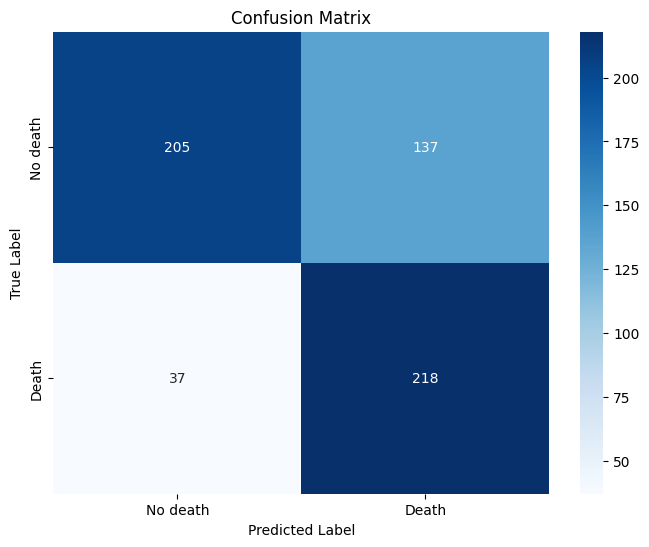

In [ ]:
# applying selected threshold to test set
evaluate_with_threshold(
    model=baseline_model_fe,
    X=X_test,
    y=y_test,
    threshold=best_threshold_recall['threshold'],
    target_names=['No death', 'Death']
)

The model achieves a recall of 0.855 for mortality, successfully identifying the majority of high-risk patients. This improvement in sensitivity comes at the cost of reduced precision and overall accuracy, which is an expected and acceptable trade-off in a clinical risk screening context.

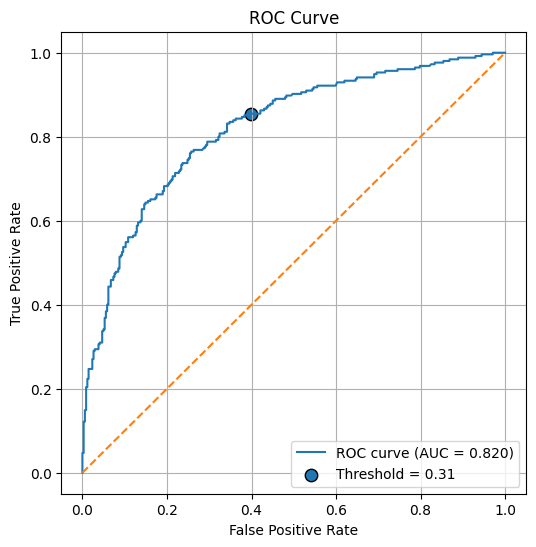

In [ ]:
plot_roc_with_threshold(
    model=baseline_model_fe,
    X=X_test,
    y=y_test,
    threshold=best_threshold_recall['threshold']
)

### 4.2.7 Logistic Regression Assumptions

Logistic regression assumes a binary outcome, independence of observations, correct model specification with linearity in the logit for continuous predictors, absence of strong multicollinearity, and an adequate sample size.

These assumptions were assessed through study design considerations (each observation corresponds to a unique patient, target is binary variable), feature transformations, encoding strategies, and model diagnostics.

Assumptions specific to linear regression, such as normality and homoscedasticity of residuals, are not required for logistic regression models.

### 4.2.8 Inference analysis

To complement the predictive analysis, we will fit a logistic regression model using statsmodels to assess the statistical association between predictors and recurrence.

This analysis is observational and identifies statistical associations rather than causal effects.

In [ ]:
X_sm = preprocessor_fe.fit_transform(X_train)
y_sm = y_train.values

X_sm = sm.add_constant(X_sm)

In [ ]:
logit_model = sm.Logit(y_sm, X_sm)
result = logit_model.fit(disp=False)
print(result.summary())

                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 2385
Model:                          Logit   Df Residuals:                     2372
Method:                           MLE   Df Model:                           12
Date:                Thu, 05 Feb 2026   Pseudo R-squ.:                  0.1706
Time:                        22:25:53   Log-Likelihood:                -1349.7
converged:                       True   LL-Null:                       -1627.2
Covariance Type:            nonrobust   LLR p-value:                3.949e-111
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6105      0.322     -5.009      0.000      -2.241      -0.980
x1            -0.4890      0.051     -9.576      0.000      -0.589      -0.389
x2             0.7765      0.060     12.995      0.0

The logistic regression model showed a significantly better fit than the null model (likelihood ratio test, p < 0.001) and successfully converged. The McFadden pseudo R² of 0.17 indicates a reasonable model fit, which is typical for clinical data, supporting the validity of the estimated odds ratios and confidence intervals.

In [ ]:
coef = result.params
odds_ratios = np.exp(coef)

conf = result.conf_int()
conf = np.exp(conf)

feature_names = preprocessor_fe.get_feature_names_out()
feature_names = np.insert(feature_names, 0, "Intercept")

or_summary = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coef,
    "Odds Ratio": odds_ratios,
    "2.5% CI OR": conf[:, 0],
    "97.5% CI OR": conf[:, 1],
    "p-value": result.pvalues
})

print(or_summary)

            Feature  Coefficient  Odds Ratio  2.5% CI OR  97.5% CI OR  p-value
0         Intercept      -1.6105      0.1998      0.1064       0.3752   0.0000
1         num__year      -0.4890      0.6133      0.5549       0.6778   0.0000
2    num__nodes_log       0.7765      2.1738      1.9335       2.4439   0.0000
3          age__age       0.0682      1.0706      0.9083       1.2619   0.4162
4        age__age^2       0.2440      1.2764      1.1703       1.3920   0.0000
5       cat__meno_1       0.2029      1.2250      0.8730       1.7190   0.2404
6     cat__er_pos_1       0.0704      1.0729      0.8240       1.3970   0.6014
7    cat__pgr_pos_1      -0.3847      0.6807      0.5342       0.8673   0.0019
8     cat__hormon_1      -0.5264      0.5908      0.4272       0.8169   0.0015
9      cat__chemo_1      -0.3757      0.6868      0.5189       0.9090   0.0086
10        ord__size       0.7084      2.0307      1.0612       3.8859   0.0324
11       ord__grade       0.6251      1.8685      1.

Features were standardized and one-hot encoded; thus, odds ratios are interpreted per one-unit increase in the standardized predictors.

The inferential analysis identified several clinically meaningful predictors of mortality. Higher tumor grade, larger tumor size, and increased lymph node involvement were strongly associated with higher odds of death, while hormonal therapy, chemotherapy, and positive progesterone receptor status were associated with reduced risk. A significant quadratic age effect indicates a non-linear relationship between age and mortality, with risk increasing more rapidly at older ages. In addition to this, a later year of diagnosis is associated with a lower risk of death, which likely reflects improved treatment and diagnostics.

Some predictors, including menopausal status, ER status, and the size-grade interaction, did not reach statistical significance. This is expected in multivariable models with interaction terms and does not necessarily indicate lack of clinical relevance. Overall, the results are consistent with established clinical knowledge and support the validity of the final model.

## 4.3 Comparison of Recurrence and Mortality Classification Models

Although recurrence and mortality are related clinical outcomes, they represent different stages of disease progression and therefore exhibit distinct predictive patterns. The recurrence model resulted in a relatively parsimonious specification, with feature selection retaining a small subset of strong clinical predictors without loss of predictive performance. This suggests that recurrence risk in this dataset is primarily driven by tumor burden and treatment-related factors.

In contrast, mortality prediction benefited from a more complex model. The inclusion of non-linear age effects and a tumor size–grade interaction led to a modest but consistent improvement in performance, indicating that long-term survival risk is influenced by more nuanced and non-linear relationships.

Decision thresholds were optimized to prioritize recall for the positive class, reflecting a clinical risk stratification perspective. Overall, the differences between the two models are clinically plausible and highlight the importance of outcome-specific modeling strategies.

# 5. Time-to-Event Analysis

## 5.1 Objectives of Time-to-Event Analysis

Previous sections focused on predicting binary outcomes such as recurrence and death. While informative, classification models do not account for event timing or censoring.

Time-to-event analysis explicitly models the time until an event occurs while handling right-censored observations and heterogeneous follow-up. This is essential in clinical studies where not all patients experience the event during observation.

In this section, Cox proportional hazards models are used to analyze:
* Recurrence-Free Survival (RFS): time from baseline to first recurrence;
* Overall Survival (OS): time from baseline to death from any cause.

The objective is to quantify how clinical and pathological factors affect the hazard of recurrence and death over time, and to compare whether predictors have consistent or endpoint-specific effects across RFS and OS.

## 5.2 Definition of Time Variables and Censoring Mechanism

Two time-to-event variables are analyzed:
* `rtime`: time to recurrence or censoring (RFS);
* `dtime`: time to death or censoring (OS).

Each outcome is paired with a binary event indicator (1 = event, 0 = censored). Right censoring is assumed throughout.

RFS and OS are modeled as distinct processes. Patients who died without a recorded recurrence are treated as censored in the RFS analysis but as events in the OS analysis. This reflects differences in follow-up mechanisms commonly observed in clinical datasets, where mortality information may be updated after recurrence follow-up ends.

This approach ensures that each endpoint is analyzed according to its clinical definition while appropriately accounting for censoring.

## 5.3 Exploratory Survival Analysis

In [ ]:
def summarize_time_to_event(df, time_col, event_col):
    """
    Computes descriptive survival statistics for a given time-to-event outcome.
    """
    n_total = df.shape[0]
    n_events = df[event_col].sum()
    n_censored = n_total - n_events

    max_time = df[time_col].max()

    # Median follow-up time (using reverse KM)
    km_followup = KaplanMeierFitter()
    km_followup.fit(df[time_col], event_observed=1 - df[event_col])
    median_followup = km_followup.median_survival_time_

    # Median survival time
    km_survival = KaplanMeierFitter()
    km_survival.fit(df[time_col], event_observed=df[event_col])
    median_survival = km_survival.median_survival_time_

    return pd.Series({
        "N": n_total,
        "Number of events": int(n_events),
        "Number censored": int(n_censored),
        "Median follow-up time": median_followup,
        "Median survival time": median_survival,
        "Maximum observed time": max_time
    })

### 5.3.1 Characteristics for Recurrence-Free Survival

In [ ]:
rfs_summary = summarize_time_to_event(
    df=df,
    time_col=time_vars[0],
    event_col=target_vars[0]
)

rfs_summary.to_frame(name="Recurrence-Free Survival")

,Recurrence-Free Survival
N,"2,982.0000"
Number of events,"1,473.0000"
Number censored,"1,509.0000"
Median follow-up time,"3,156.0000"
Median survival time,"3,229.0000"
Maximum observed time,"7,043.0000"


The RFS analysis included 2982 patients, with 1473 recurrence events and 1509 censored observations. Median follow-up time was 3156 days, and median recurrence-free survival was 3229 days, indicating sufficient event accumulation for reliable estimation. Follow-up extended beyond 7000 days for a subset of patients, allowing assessment of late recurrences.

### 5.3.2 Characteristics for Overall Survival

In [ ]:
os_summary = summarize_time_to_event(
    df=df,
    time_col=time_vars[1],
    event_col=target_vars[1]
)

os_summary.to_frame(name="Overall Survival")

,Overall Survival
N,"2,982.0000"
Number of events,"1,272.0000"
Number censored,"1,710.0000"
Median follow-up time,"3,387.0000"
Median survival time,"4,033.0000"
Maximum observed time,"7,043.0000"


The OS analysis included the same cohort, with 1272 deaths and 1710 censored observations. Median follow-up was 3387 days, and median overall survival was 4033 days. Despite a higher proportion of censoring, the median survival time was reached, supporting the suitability of Cox modeling for OS.

### 5.3.3 Kaplan–Meier Survival Curves

<Axes: title={'center': 'Recurrence-Free Survival'}, xlabel='timeline'>

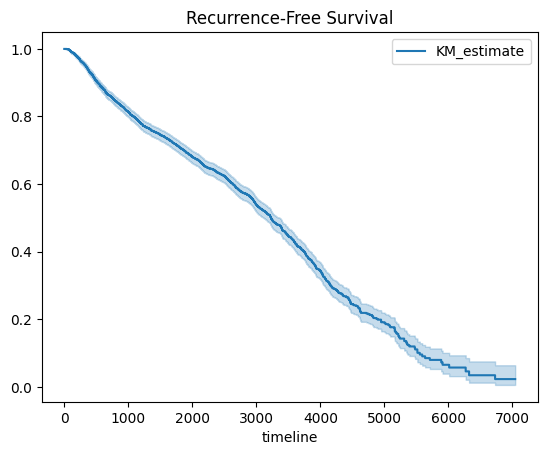

In [ ]:
kmf_rfs = KaplanMeierFitter()
kmf_rfs.fit(durations = df[time_vars[0]], event_observed = df[target_vars[0]])
kmf_rfs.plot(title='Recurrence-Free Survival', ci_show=True)

<Axes: title={'center': 'Overall Survival'}, xlabel='timeline'>

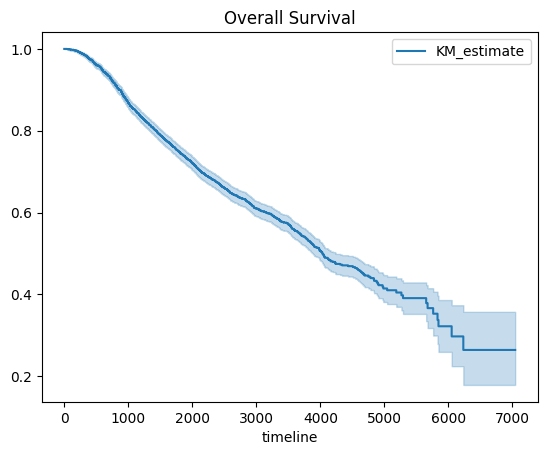

In [ ]:
kmf_os = KaplanMeierFitter()
kmf_os.fit(durations = df[time_vars[1]], event_observed = df[target_vars[1]])
kmf_os.plot(title='Overall Survival', ci_show=True)

Kaplan-Meier curves for both RFS and OS show a gradual decline in survival probability over time, with no abrupt risk changes. Confidence intervals widen at later time points due to fewer individuals at risk.

As Kaplan-Meier estimates do not adjust for covariates, these descriptive results motivate multivariable Cox models to assess predictor-specific effects on survival.

## 5.4 Cox Model for Recurrence-Free Survival

Feature selection and hyperparameter tuning will be performed using a scikit-learn compatible Cox proportional hazards model to enable cross-validation. The final model will then be refitted using the lifelines implementation to allow detailed inspection of hazard ratios and assessment of model assumptions.

In [ ]:
def prepare_cox_data(preprocessor, X, time, event):
    """
    Apply preprocessing and return a DataFrame suitable for lifelines CoxPHFitter.
    """
    X_transformed = preprocessor.fit_transform(X)

    feature_names = preprocessor.get_feature_names_out()
    X_df = pd.DataFrame(X_transformed, columns=feature_names, index=X.index)

    X_df['time'] = time.values
    X_df['event'] = event.values

    return X_df

In [ ]:
def fit_cox(df_cox, penalizer=0, strata=None):
    """
    Fit a penalized Cox model with a given penalizer value.
    """
    cph = CoxPHFitter(penalizer=penalizer)
    cph.fit(
        df_cox,
        duration_col='time',
        event_col='event',
        strata=strata
    )
    return cph

In [ ]:
def evaluate_cox_model(cph):
    """
    Return main evaluation metrics for a Cox model.
    """
    return {
        'c_index': cph.concordance_index_,
        'log_likelihood': cph.log_likelihood_,
        'aic': cph.AIC_partial_
    }

In [ ]:
def tune_penalized_cox_sksurv(
    cox,
    X,
    y,
    alphas,
    n_splits=5
):
    """
    Tune penalized Cox model using cross-validated C-index.
    """

    param_grid = {
        "alpha": alphas
    }

    cv = KFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=RANDOM_STATE
    )

    grid_search = GridSearchCV(
        estimator=cox,
        param_grid=param_grid,
        cv=cv,
        scoring=None, # using cox.score(X, y) by default
        n_jobs=-1,
        refit=True
    )

    grid_search.fit(X, y)

    return grid_search

In [ ]:
def feature_selection_cox_sfs(
    cox,
    X,
    y,
    direction="backward",
    n_splits=5
):
    """
    Perform feature selection for Cox model using SequentialFeatureSelector.
    """

    cv = KFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=RANDOM_STATE
    )

    sfs = SequentialFeatureSelector(
        estimator=cox,
        n_features_to_select="auto",
        direction=direction,
        cv=cv,
        scoring=None, # using cox.score(X, y) by default
        n_jobs=-1
    )

    sfs.fit(X, y)

    selected_features = X.columns[sfs.get_support()].tolist()
    return selected_features

In [ ]:
def evaluate_cox_cv(cox, X, y, n_splits=5):
    """
    Evaluate Cox Model in terms of Concordance Index and
    Concordance Index standard deviation
    using KFold Cross Validation
    """
    cv = KFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=RANDOM_STATE
    )

    cv_scores = cross_val_score(
        cox,
        X,
        y,
        cv=cv,
        scoring=None, # using cox.score(X, y) by default
        n_jobs=-1
    )

    print('Concordance Index mean:', cv_scores.mean())
    print('Concordance Index standard deviation:', cv_scores.std())

    return cv_scores.mean(), cv_scores.std()

In [ ]:
def residuals_plot(df, resid_df, variables, resid='deviance', ncols=3):
    """
    Scatterplot of deviance or martingale residuals vs numerical variables.
    """
    nrows = math.ceil(len(variables) / ncols)

    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axs = axs.flatten()

    for ax, var in zip(axs, variables):
        resid_df[var] = df[var]
        sns.scatterplot(
            data=resid_df,
            x=var, y=resid, hue='event',
            alpha=0.75,
            ax=ax
        )

        # Ensure the x-values for lowess are sorted
        sorted_indices = resid_df[var].argsort()
        sorted_x = resid_df[var].iloc[sorted_indices]
        sorted_y = resid_df[resid].iloc[sorted_indices]

        # Calculate lowess only if there's enough data and variability
        y_lowess_covariate = lowess(sorted_y, sorted_x, return_sorted=False)
        ax.plot(sorted_x, y_lowess_covariate, color="k", alpha=1.0, linewidth=2)
        ax.set_title(f"{resid} residuals vs {var}")
        ax.set_xlabel(f"{var}")
        ax.set_ylabel(f'{resid} residuals')

    for ax in axs[len(variables):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

### 5.4.1 Baseline model

In [ ]:
# preprocessing
X_processed = preprocessor.fit_transform(X)
X_processed = pd.DataFrame(
    X_processed,
    columns=preprocessor.get_feature_names_out(),
    index=X.index
)

y_recur = Surv.from_dataframe(event=target_vars[0],
                             time=time_vars[0],
                             data=df)
# model
cox_baseline = CoxPHSurvivalAnalysis()

# model evaluation
print('Cox model (baseline)')
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_baseline, X_processed, y_recur)

Cox model (baseline)
Concordance Index mean: 0.7283190900774568
Concordance Index standard deviation: 0.00902344721900211


We first fitted a baseline Cox proportional hazards model using standard clinical covariates without regularization. The model achieved a concordance index of 0.728 with low variability across cross-validation folds. This model serves as a reference point for subsequent model extensions.

### 5.4.2 Regularized model

In [ ]:
# penalization tuning
alphas = np.logspace(-5, 3, 10)

cox_grid = tune_penalized_cox_sksurv(
    cox_baseline,
    X_processed,
    y_recur,
    alphas=alphas,
)

cox_best_model = cox_grid.best_estimator_
best_alpha = cox_grid.best_params_['alpha']

# model evaluation
print('Cox model (L2 regularized)')
print("Best alpha:", best_alpha)
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_best_model, X_processed, y_recur)

Cox model (L2 regularized)
Best alpha: 16.681005372000556
Concordance Index mean: 0.7286953938658166
Concordance Index standard deviation: 0.009687723928958131


To assess whether coefficient shrinkage could improve model performance and stability, we fitted an L2-regularized Cox model and tuned the regularization parameter using cross-validation.

The concordance index remained essentially unchanged compared to the baseline model. Regularization did not provide a meaningful performance gain.

### 5.4.3 Feature Engineering

In [ ]:
# preprocessing with new features
X_processed_fe = preprocessor_fe.fit_transform(X)
X_processed_fe = pd.DataFrame(
    X_processed_fe,
    columns=preprocessor_fe.get_feature_names_out(),
    index=X.index
)

# model evaluation
print('Cox model (baseline) - Feature Engineering')
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_baseline, X_processed_fe, y_recur)

Cox model (baseline) - Feature Engineering
Concordance Index mean: 0.7308806243706973
Concordance Index standard deviation: 0.009038954492234994


Next, we extended the baseline model by adding derived features, including nonlinear effects of age and interaction terms.

This feature engineering step led to a modest improvement in concordance index, accompanied by a slight reduction in its standard deviation.

These results indicate that incorporating nonlinear and interaction effects captures additional prognostic information relevant for overall survival.

### 5.4.4 Feature Selection (SFS)

In [ ]:
# feature selection
cox_selected_features = feature_selection_cox_sfs(
    cox_baseline,
    X_processed_fe,
    y_recur,
    direction="backward"
)

print('Selected features:', cox_selected_features)

if 'age__age^2' in cox_selected_features and 'age__age' not in cox_selected_features:
    cox_selected_features.append('age__age')

if 'ord__size grade' in cox_selected_features and ('ord__size' not in cox_selected_features or 'ord__grade' not in cox_selected_features):
    cox_selected_features.append('ord__size')
    cox_selected_features.append('ord__grade')

print("Final selected features:", cox_selected_features)

Selected features: ['num__nodes_log', 'age__age', 'cat__hormon_1', 'cat__chemo_1', 'ord__size', 'ord__grade']
Final selected features: ['num__nodes_log', 'age__age', 'cat__hormon_1', 'cat__chemo_1', 'ord__size', 'ord__grade']


In [ ]:
# model evaluation
print('Cox model (baseline) - Feature Selection')
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_baseline, X_processed_fe[cox_selected_features], y_recur)

Cox model (baseline) - Feature Selection
Concordance Index mean: 0.7300665013391308
Concordance Index standard deviation: 0.015000936837255598


We additionally explored automated feature selection using a Sequential Feature Selector to identify a more parsimonious model.

The resulting model did not improve the concordance index and exhibited slightly increased variability across folds.

Given the absence of performance gains, we retained the full feature-engineered model for subsequent analyses.

### 5.4.5 Final hyperparameter tuning

In [ ]:
cox_grid = tune_penalized_cox_sksurv(
    cox_baseline,
    X_processed_fe,
    y_recur,
    alphas=alphas,
)

cox_best_model = cox_grid.best_estimator_
best_alpha = cox_grid.best_params_['alpha']

# model evaluation
print('Cox model (L2 regularized) - Feature Engineering')
print("Best alpha:", best_alpha)
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_best_model, X_processed_fe, y_recur)

Cox model (L2 regularized) - Feature Engineering
Best alpha: 2.154434690031882
Concordance Index mean: 0.7310040636391472
Concordance Index standard deviation: 0.009217022180640381


We also evaluated whether L2 regularization could further improve the feature-engineered model.

Despite tuning the regularization strength, only marginal changes in concordance index were observed.

Therefore, regularization was not retained, and the unpenalized feature-engineered model was used as the candidate final model.

### 5.4.6 Assumptions checking

In this section CoxPHFitter will be used with the same parameters and variables as defined in the final model to check Cox Proportional Hazard Model assumptions.

In [ ]:
# preprocessing
df_cox = prepare_cox_data(
    preprocessor_fe,
    X,
    time=df[time_vars[0]],
    event=df[target_vars[0]]
)

# model fitting
cph_baseline_fe = fit_cox(df_cox)

# model evaluation
print('Cox model (baseline) - Feature Engineering')
evaluate_cox_model(cph_baseline_fe)

Cox model (baseline) - Feature Engineering


{'c_index': np.float64(0.7334079274281838),
 'log_likelihood': np.float64(-10000.196815867143),
 'aic': np.float64(20024.393631734285)}

In [ ]:
cph_baseline_fe.print_summary()

<lifelines.CoxPHFitter: fitted with 2982 total observations, 1509 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 2982
number of events observed = 1473
   partial log-likelihood = -10000.20
         time fit was run = 2026-02-05 22:28:46 UTC

---
                 coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                        
num__year        0.36      1.44      0.03            0.30            0.43                1.35                1.53
num__nodes_log   0.66      1.93      0.03            0.60            0.72                1.83                2.04
age__age        -0.14      0.87      0.05           -0.23           -0.05                0.80                0.95
age__age^2       0.08      1.08      0.02            0.03            0.12                1.03                1.13
cat__meno_1      0.09      1.09      0.09           -0.09            0.27                0.91                1.31
cat__er_pos_1   -0.03      0.97      0.07           -0.17            0.11                0.84                1.12
cat__pgr_pos_1  -0.08      0.93      0.07           -0.21            0.06                0.81                1.06
cat__hormon_1   -0.54      0.58      0.09           -0.72           -0.36                0.49                0.70
cat__chemo_1    -0.50      0.61      0.08           -0.64           -0.35                0.53                0.71
ord__size        0.96      2.61      0.19            0.58            1.33                1.79                3.79
ord__grade       0.66      1.93      0.10            0.47            0.85                1.60                2.34
ord__size grade -0.37      0.69      0.10           -0.57           -0.17                0.57                0.85

                 cmp to     z      p  -log2(p)
covariate                                     
num__year          0.00 11.07 <0.005     92.20
num__nodes_log     0.00 22.73 <0.005    377.48
age__age           0.00 -2.98 <0.005      8.44
age__age^2         0.00  3.27 <0.005      9.84
cat__meno_1        0.00  0.95   0.34      1.55
cat__er_pos_1      0.00 -0.44   0.66      0.60
cat__pgr_pos_1     0.00 -1.13   0.26      1.96
cat__hormon_1      0.00 -5.89 <0.005     27.93
cat__chemo_1       0.00 -6.60 <0.005     34.50
ord__size          0.00  4.99 <0.005     20.65
ord__grade         0.00  6.84 <0.005     36.84
ord__size grade    0.00 -3.58 <0.005     11.51
---
Concordance = 0.73
Partial AIC = 20024.39
log-likelihood ratio test = 894.99 on 12 df
-log2(p) of ll-ratio test = 608.46


   Bootstrapping lowess lines. May take a moment...

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__year' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__year' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__year' using pd.cut, and then specify it in
`strata=['num__year', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...


2. Variable 'num__nodes_log' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional for

[[<Axes: xlabel='rank-transformed time\n(p=0.0000)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0000)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0000)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0000)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0137)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0140)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.5667)'>,
  <Axes: xlabel='km-transformed time\n(p=0.4613)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.2218)'>,
  <Axes: xlabel='km-transformed time\n(p=0.2390)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0665)'>,
  <Axes: xlabel='km-transformed time\n(p=0.1078)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0001)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0002)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.8062)'>,
  <Axes: xlabel='km-transformed time\n(p=0.7585)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.4957)'>,
  <Axes: xlabel='km-transformed time\n(p=0.8739)'>],
 [<Axes: xlabel='rank-transformed tim

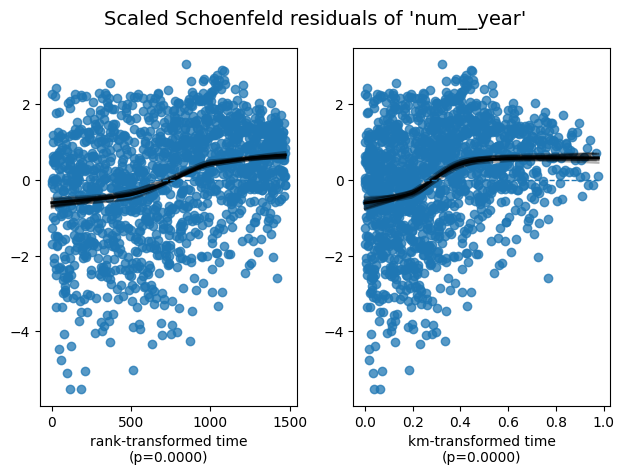

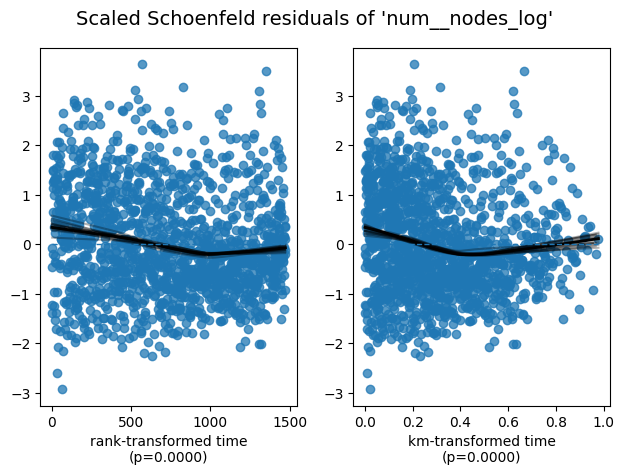

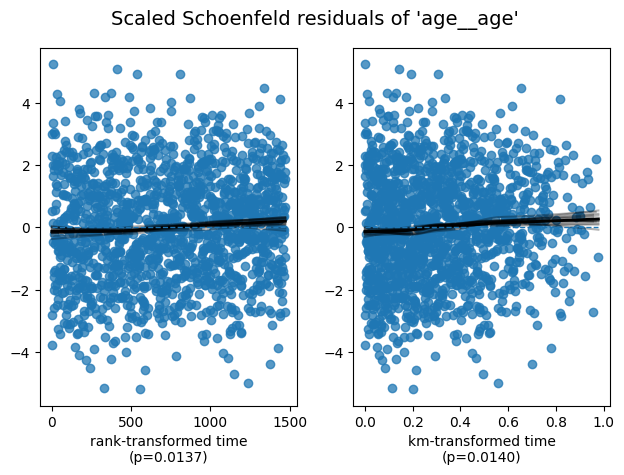

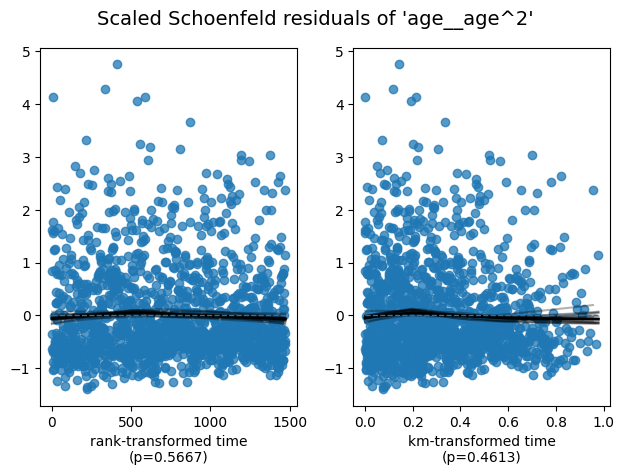

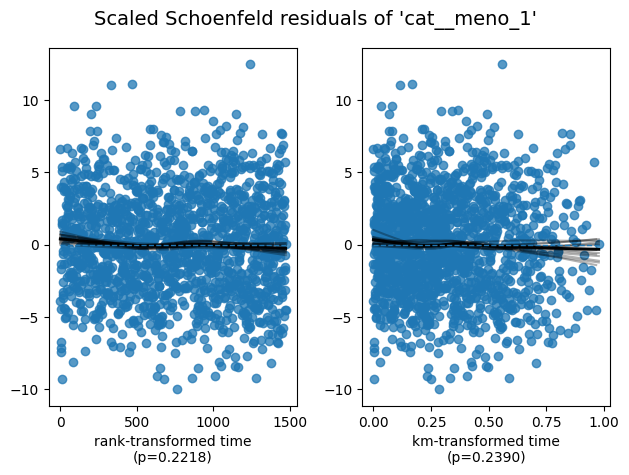

...

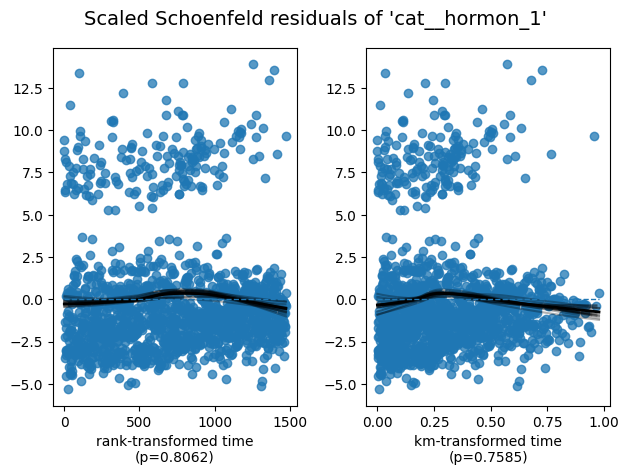

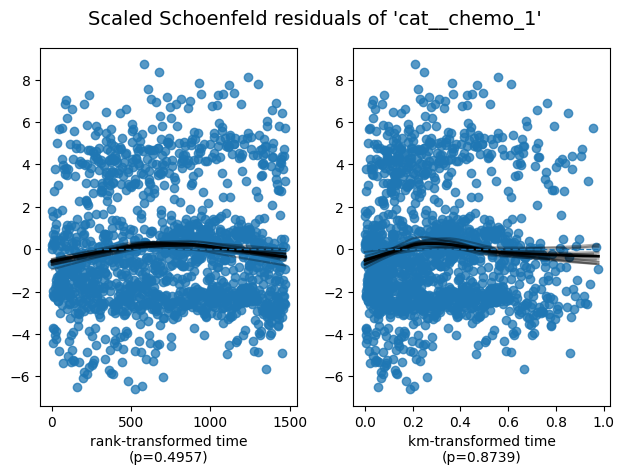

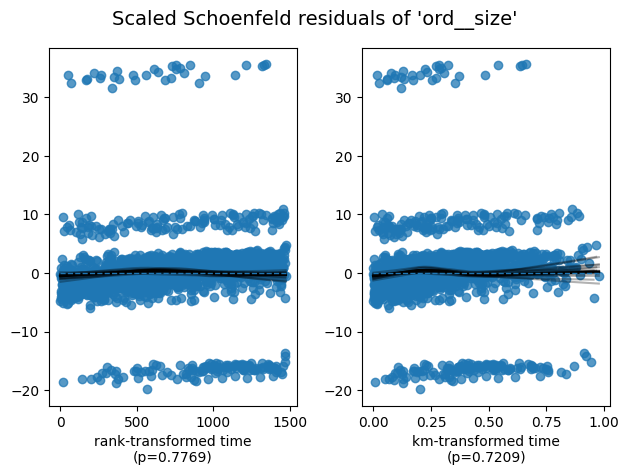

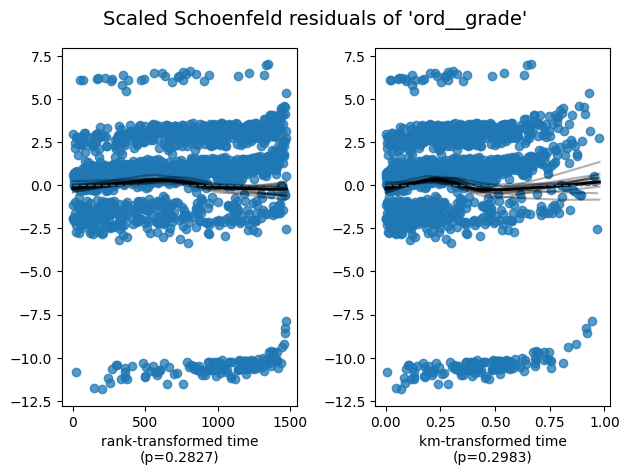

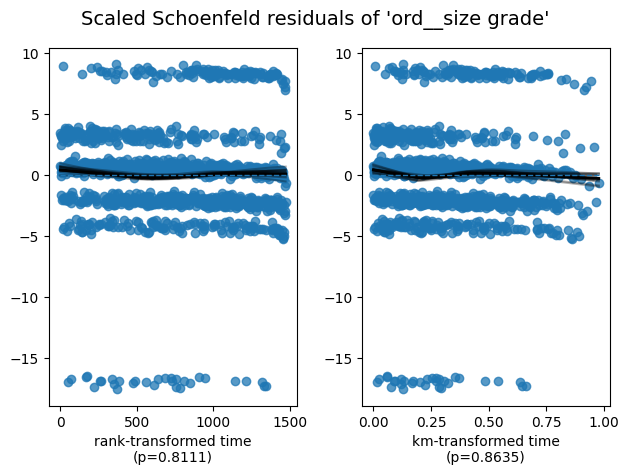

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox,
    p_value_threshold=0.05,
    show_plots=True
)

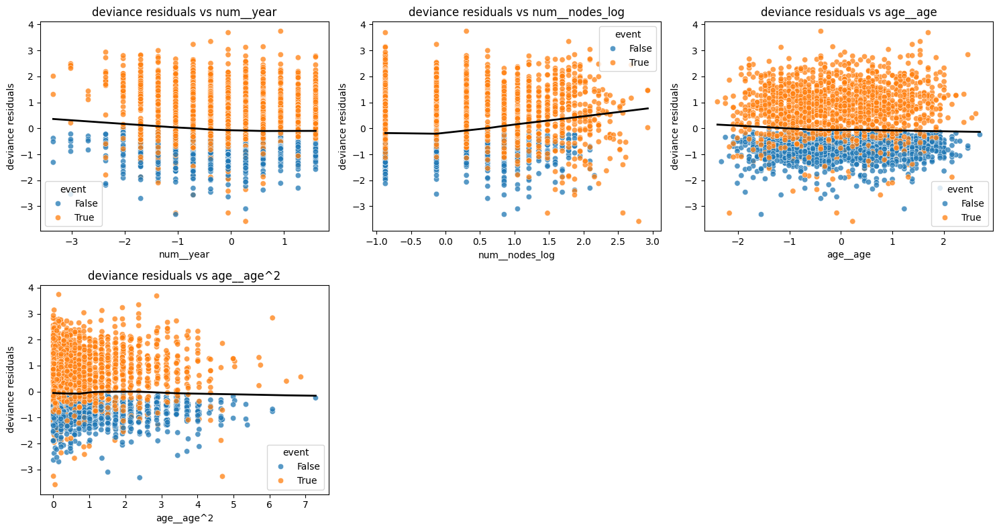

In [ ]:
# assumptions check: Deviance residuals
num_vars_cox = ['num__year', 'num__nodes_log', 'age__age', 'age__age^2']

dev_resid = cph_baseline_fe.compute_residuals(df_cox, kind="deviance")
residuals_plot(df_cox, dev_resid, num_vars_cox, ncols=3)

Diagnostic tests and residual plots indicated violations of the proportional hazards assumption for several covariates, most notably `num__nodes_log`, `age__age`, `cat__pgr_pos_1` and `num__year`.
These findings motivated further model refinement.

Strategies to improve the model:
1. Stratification by `cat__pgr_pos_1`.
2. Adding interaction of `num__year` or `num__nodes_log` with time variable.

In [ ]:
# model with stratification by cat__pgr_pos_1
cph_baseline_fe = fit_cox(df_cox, strata='cat__pgr_pos_1')

# model evaluation
print('Cox model - Stratification by cat__pgr_pos_1')
evaluate_cox_model(cph_baseline_fe)

Cox model - Stratification by cat__pgr_pos_1


{'c_index': np.float64(0.7339649772459887),
 'log_likelihood': np.float64(-9052.982191889043),
 'aic': np.float64(18127.964383778086)}

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox,
    p_value_threshold=0.05,
    show_plots=False
)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__year' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__year' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__year' using pd.cut, and then specify it in
`strata=['num__year', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


2. Variable 'num__nodes_log' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to spec

[]

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


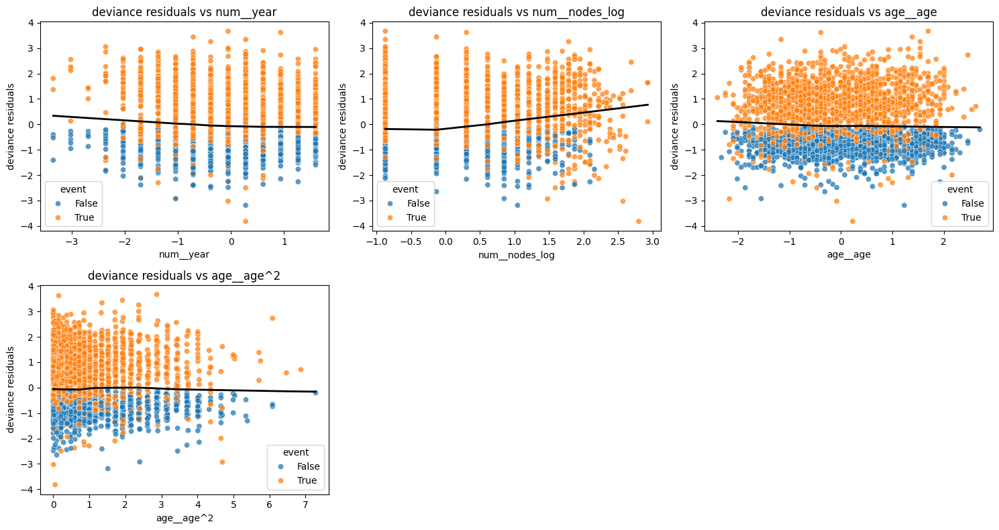

In [ ]:
# assumptions check: Deviance residuals
dev_resid = cph_baseline_fe.compute_residuals(df_cox, kind="deviance")
residuals_plot(df_cox, dev_resid, num_vars_cox, ncols=3)

Stratification by progesterone receptor status substantially improved model fit, as reflected by a marked increase in log-likelihood and a reduction in AIC. This suggests distinct baseline hazard functions across progesterone receptor strata. Accordingly, this stratified model was retained for further evaluation.

Time-varying effects will be subsequently evaluated for selected covariates.

In [ ]:
# time-varying effect for nodes_log
df_cox_nodes_interaction = df_cox.copy()
df_cox_nodes_interaction["nodes_log_x_logtime"] = (
    df_cox_nodes_interaction["num__nodes_log"] * np.log(df_cox_nodes_interaction['time'])
)

In [ ]:
# model fitting
cph_baseline_fe = fit_cox(df_cox_nodes_interaction, strata='cat__pgr_pos_1')

# model evaluation
print('Cox model - Stratification by cat__pgr_pos_1 and nodes_log x time interaction')
evaluate_cox_model(cph_baseline_fe)

Cox model - Stratification by cat__pgr_pos_1 and nodes_log x time interaction


{'c_index': np.float64(0.6897939869476907),
 'log_likelihood': np.float64(-9238.087293662256),
 'aic': np.float64(18500.174587324513)}

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox_nodes_interaction,
    p_value_threshold=0.05,
    show_plots=False
)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__year' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__year' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__year' using pd.cut, and then specify it in
`strata=['num__year', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


2. Variable 'num__nodes_log' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to spec

[]

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


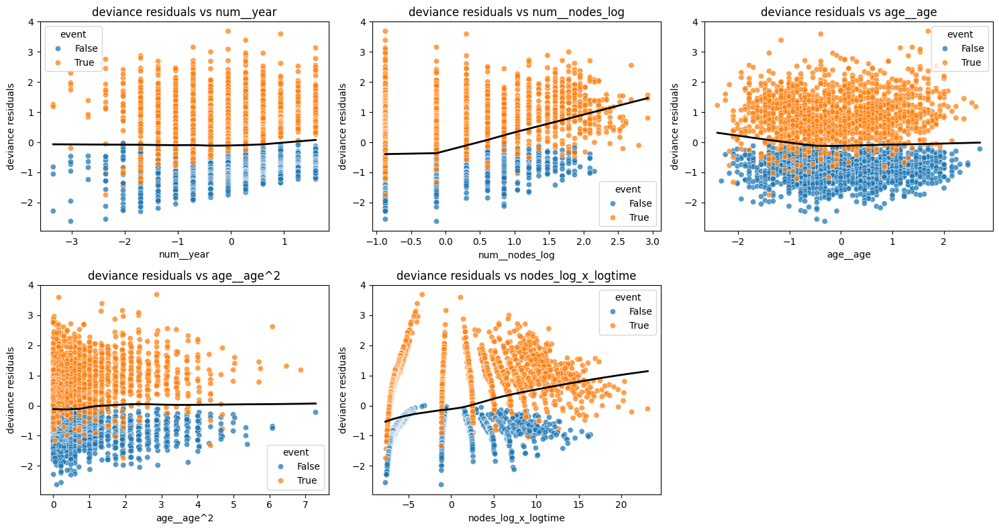

In [ ]:
# assumptions check: Deviance residuals
num_vars_cox_nodes_interaction = num_vars_cox + ['nodes_log_x_logtime']
dev_resid = cph_baseline_fe.compute_residuals(df_cox_nodes_interaction, kind="deviance")
residuals_plot(df_cox_nodes_interaction, dev_resid, num_vars_cox_nodes_interaction, ncols=3)

Introducing a time-dependent effect for nodal involvement led to a deterioration in model performance and increased instability, indicating that a simple log(time) interaction may not adequately capture the underlying temporal pattern.

In [ ]:
# time-varying effect for nodes_log
df_cox_year_interaction = df_cox.copy()
df_cox_year_interaction["year_x_logtime"] = (
    df_cox_year_interaction["num__year"] * np.log(df_cox_year_interaction['time'])
)

In [ ]:
# model fitting
cph_baseline_fe = fit_cox(df_cox_year_interaction, strata='cat__pgr_pos_1')

# model evaluation
print('Cox model - Stratification by cat__pgr_pos_1 and year x time interaction')
evaluate_cox_model(cph_baseline_fe)

Cox model - Stratification by cat__pgr_pos_1 and year x time interaction


{'c_index': np.float64(0.7445878477602607),
 'log_likelihood': np.float64(-8929.496743136264),
 'aic': np.float64(17882.993486272528)}

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox_year_interaction,
    p_value_threshold=0.05,
    show_plots=False
)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__year' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__year' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__year' using pd.cut, and then specify it in
`strata=['num__year', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


2. Variable 'num__nodes_log' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to spec

[]

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


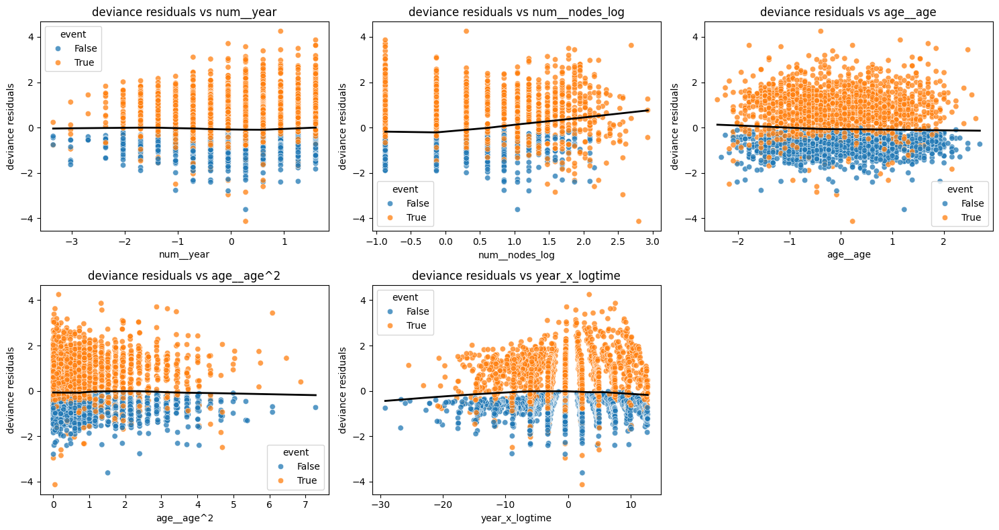

In [ ]:
# assumptions check: Deviance residuals
num_vars_cox_year_interaction = num_vars_cox + ['year_x_logtime']
dev_resid = cph_baseline_fe.compute_residuals(df_cox_year_interaction, kind="deviance")
residuals_plot(df_cox_year_interaction, dev_resid, num_vars_cox_year_interaction, ncols=3)

In contrast, allowing the effect of year of the surgery to vary over time resulted in consistent improvements across all performance metrics, including concordance index and AIC, and yielded improved residual diagnostics.

Although nodal involvement continued to exhibit departures from the proportional hazards assumption, this variable was retained due to its strong and consistent prognostic value. Overall, the final stratified Cox model with a time-varying effect for calendar year provided the best balance between model fit, c-index, and clinical interpretability.

### 5.4.7 Hazard Ratio Interpretation

In [ ]:
def hr_df_plot(model):
    """
    Displaying dataframe with Hazarad Ratios and plotting them.
    """
    summary = model.summary.copy()

    summary["HR"] = np.exp(summary["coef"])
    summary["HR_lower_95"] = np.exp(summary["coef lower 95%"])
    summary["HR_upper_95"] = np.exp(summary["coef upper 95%"])

    display(summary[[
        "coef",
        "HR",
        "HR_lower_95",
        "HR_upper_95",
        "p"
    ]].sort_values("HR", ascending=False))

    fig, ax = plt.subplots(figsize=(10, 6))
    model.plot(hazard_ratios=True, ax=ax)
    plt.title("Hazard Ratios with 95% Confidence Intervals")
    plt.tight_layout()
    plt.show()

,coef,HR,HR_lower_95,HR_upper_95,p
covariate,,,,,
ord__size,0.9536,2.5951,1.7812,3.7811,0.0000
ord__grade,0.6619,1.9385,1.6037,2.3434,0.0000
num__nodes_log,0.6524,1.9202,1.8129,2.0338,0.0000
year_x_logtime,0.6234,1.8652,1.7397,1.9998,0.0000
cat__meno_1,0.0828,1.0864,0.9033,1.3065,0.3789
age__age^2,0.0768,1.0798,1.0303,1.1317,0.0013
cat__er_pos_1,-0.0374,0.9633,0.8361,1.1099,0.6048
age__age,-0.1327,0.8757,0.7998,0.9588,0.0041
ord__size grade,-0.3535,0.7022,0.5746,0.8581,0.0005


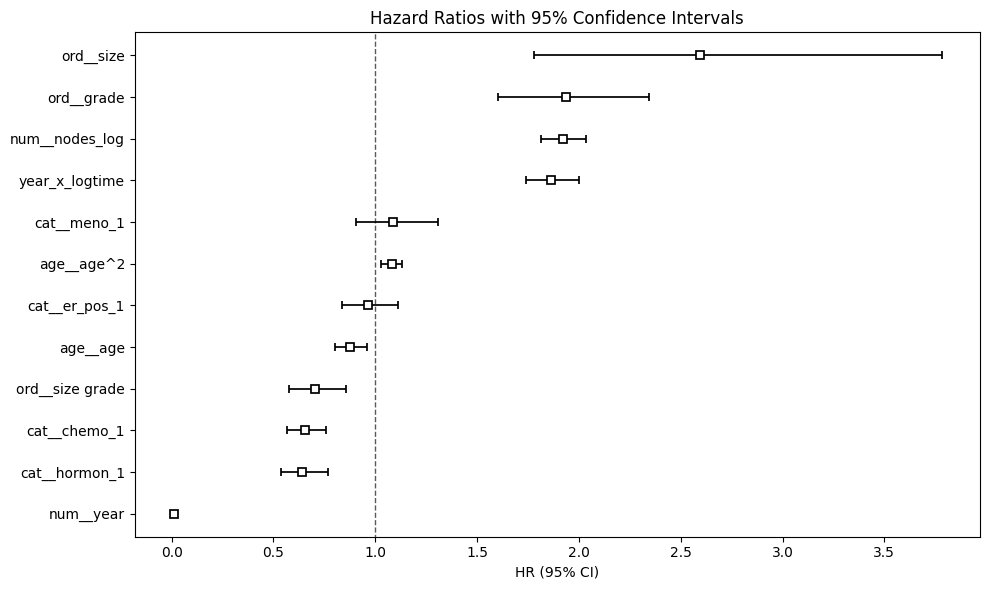

In [ ]:
hr_df_plot(cph_baseline_fe)

The final Cox proportional hazards model for overall survival was stratified by PGR status and included feature-engineered covariates. Hazard ratios (HRs) are interpreted conditional on the baseline hazard within each stratum.

* Tumor size (`ord__size`) was strongly associated with recurrence risk: each increase in tumor size category was associated with an approximately 2.6-fold higher hazard of recurrence.

* Tumor grade (`ord__grade`) showed a significant effect, with higher grade tumors associated with an almost twofold increase in recurrence hazard.

* Log-transformed number of positive lymph nodes (`num__nodes_log`) was a strong predictor of recurrence, with higher values associated with a ~92% increase in hazard, indicating a substantial adverse prognostic effect.

* Year of surgery (`num__year`) exhibited a strong protective effect at early follow-up times, suggesting that more recent treatment periods are associated with markedly lower early recurrence risk.

* The time-dependent interaction between year of surgery and log(time) (`year_x_logtime`) indicates that the protective effect of more recent surgery years attenuates over time, consistent with a non-proportional hazard effect.

* Age at diagnosis (`age__age` and `age__age^2`) demonstrated a nonlinear association with recurrence risk, consistent with a U-shaped relationship, where risk initially decreases with age and then increases at older ages.

* Chemotherapy (`cat__chemo_1`) was associated with a significant reduction in recurrence risk, corresponding to an approximately 35% lower hazard.

* Hormonal therapy (`cat__hormon_1`) also showed a protective effect, reducing the hazard of recurrence by approximately 36%.

* The interaction between tumor size and grade (`ord__size grade`) suggests effect modification, partially mitigating the individual adverse effects of size and grade when considered jointly.

* Menopausal status (`cat__meno_1`) and estrogen receptor positivity (`cat__er_pos_1`) were not independently associated with recurrence risk after adjustment for other covariates.

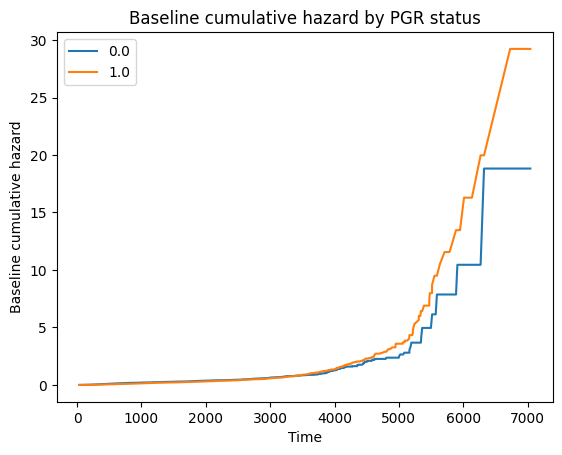

In [ ]:
# Baseline cumulative hazard by PGR status
cph_baseline_fe.baseline_cumulative_hazard_.plot()
plt.title("Baseline cumulative hazard by PGR status")
plt.xlabel("Time")
plt.ylabel("Baseline cumulative hazard")
plt.show()

The model was stratified by progesterone receptor (PGR) status, allowing distinct baseline hazards. Baseline recurrence risk was similar across strata early in follow-up but diverged after approximately 4000 days, with PGR-positive patients exhibiting a slightly higher long-term baseline hazard.

## 5.5 Cox Model for Overall Survival

### 5.5.1 Baseline model

In [ ]:
# preprocessing
X_processed = preprocessor.fit_transform(X)
X_processed = pd.DataFrame(
    X_processed,
    columns=preprocessor.get_feature_names_out(),
    index=X.index
)

y_death = Surv.from_dataframe(event=target_vars[1],
                             time=time_vars[1],
                             data=df)

# model
cox_baseline = CoxPHSurvivalAnalysis()

# model evaluation
print('Cox model (baseline)')
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_baseline, X_processed, y_death)

Cox model (baseline)
Concordance Index mean: 0.7085244177382917
Concordance Index standard deviation: 0.010198230191287678


We first fitted a baseline Cox proportional hazards model using standard clinical covariates without regularization. The model achieved a concordance index of 0.709 with low variability across cross-validation folds.
This model serves as a reference point for subsequent model extensions.

### 5.5.2 Regularized model

In [ ]:
# penalization tuning
alphas = np.logspace(-5, 3, 10)

cox_grid = tune_penalized_cox_sksurv(
    cox_baseline,
    X_processed,
    y_death,
    alphas=alphas,
)

cox_best_model = cox_grid.best_estimator_
best_alpha = cox_grid.best_params_['alpha']

# model evaluation
print('Cox model (L2 regularized)')
print("Best alpha:", best_alpha)
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_best_model, X_processed, y_death)

Cox model (L2 regularized)
Best alpha: 0.03593813663804626
Concordance Index mean: 0.7085321672975549
Concordance Index standard deviation: 0.010204146764285172


To assess whether coefficient shrinkage could improve model performance and stability, we fitted an L2-regularized Cox model and tuned the regularization parameter using cross-validation.

The concordance index remained essentially unchanged compared to the baseline model. Regularization did not provide a meaningful performance gain.

### 5.5.3 Feature Engineering

In [ ]:
# preprocessing with new features
X_processed_fe = preprocessor_fe.fit_transform(X)
X_processed_fe = pd.DataFrame(
    X_processed_fe,
    columns=preprocessor_fe.get_feature_names_out(),
    index=X.index
)

# model evaluation
print('Cox model (baseline) - Feature Engineering')
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_baseline, X_processed_fe, y_death)

Cox model (baseline) - Feature Engineering
Concordance Index mean: 0.7166412401286208
Concordance Index standard deviation: 0.009321023934278366


Next, we extended the baseline model by adding derived features, including nonlinear effects of age and interaction terms.

This feature engineering step led to a modest improvement in concordance index, accompanied by a slight reduction in its standard deviation.

These results indicate that incorporating nonlinear and interaction effects captures additional prognostic information relevant for overall survival.

### 5.5.4 Feature Selection (SFS)

In [ ]:
# feature selection
cox_selected_features = feature_selection_cox_sfs(
    cox_baseline,
    X_processed_fe,
    y_death,
    direction="backward"
)

print('Selected features:', cox_selected_features)

if 'age__age^2' in cox_selected_features and 'age__age' not in cox_selected_features:
    cox_selected_features.append('age__age')

if 'ord__size grade' in cox_selected_features and ('ord__size' not in cox_selected_features or 'ord__grade' not in cox_selected_features):
    cox_selected_features.append('ord__size')
    cox_selected_features.append('ord__grade')

print("Final selected features:", cox_selected_features)

Selected features: ['num__year', 'num__nodes_log', 'age__age^2', 'cat__pgr_pos_1', 'cat__chemo_1', 'ord__size grade']
Final selected features: ['num__year', 'num__nodes_log', 'age__age^2', 'cat__pgr_pos_1', 'cat__chemo_1', 'ord__size grade', 'age__age', 'ord__size', 'ord__grade']


In [ ]:
# model evaluation
print('Cox model (baseline) - Feature Selection')
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_baseline, X_processed_fe[cox_selected_features], y_death)

Cox model (baseline) - Feature Selection
Concordance Index mean: 0.7153810162221005
Concordance Index standard deviation: 0.010317729190561464


We additionally explored automated feature selection using a Sequential Feature Selector to identify a more parsimonious model.

The resulting model did not improve the concordance index and exhibited slightly increased variability across folds.

Given the absence of performance gains, we retained the full feature-engineered model for subsequent analyses.

### 5.5.5 Final hyperparameter tuning

In [ ]:
cox_grid = tune_penalized_cox_sksurv(
    cox_baseline,
    X_processed_fe,
    y_death,
    alphas=alphas,
)

cox_best_model = cox_grid.best_estimator_
best_alpha = cox_grid.best_params_['alpha']

# model evaluation
print('Cox model (L2 regularized) - Feature Engineering')
print("Best alpha:", best_alpha)
mean_c_baseline, std_c_baseline = evaluate_cox_cv(cox_best_model, X_processed_fe, y_death)

Cox model (L2 regularized) - Feature Engineering
Best alpha: 16.681005372000556
Concordance Index mean: 0.7173558267723894
Concordance Index standard deviation: 0.009886888939307958


We also evaluated whether L2 regularization could further improve the feature-engineered model.

Despite tuning the regularization strength, only marginal changes in concordance index were observed.

Therefore, regularization was not retained, and the unpenalized feature-engineered model was used as the candidate final model.

### 5.5.6 Assumptions checking

In this section CoxPHFitter will be used with the same parameters and variables as defined in the final model to check Cox Proportional Hazard Model assumptions.

In [ ]:
# preprocessing
df_cox = prepare_cox_data(
    preprocessor_fe,
    X,
    time=df[time_vars[1]],
    event=df[target_vars[1]]
)

# model fitting
cph_baseline_fe = fit_cox(df_cox)

# model evaluation
print('Cox model (baseline) - Feature Engineering')
evaluate_cox_model(cph_baseline_fe)

Cox model (baseline) - Feature Engineering


{'c_index': np.float64(0.7197667131212664),
 'log_likelihood': np.float64(-9171.965007073726),
 'aic': np.float64(18367.930014147452)}

In [ ]:
cph_baseline_fe.print_summary()

<lifelines.CoxPHFitter: fitted with 2982 total observations, 1710 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 2982
number of events observed = 1272
   partial log-likelihood = -9171.97
         time fit was run = 2026-02-05 22:33:50 UTC

---
                 coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                        
num__year       -0.06      0.94      0.03           -0.12            0.00                0.89                1.00
num__nodes_log   0.55      1.73      0.03            0.49            0.61                1.63                1.83
age__age         0.04      1.05      0.05           -0.05            0.14                0.95                1.15
age__age^2       0.18      1.20      0.02            0.13            0.23                1.14                1.26
cat__meno_1      0.16      1.17      0.11           -0.06            0.37                0.95                1.45
cat__er_pos_1   -0.11      0.90      0.08           -0.26            0.04                0.77                1.04
cat__pgr_pos_1  -0.26      0.77      0.07           -0.40           -0.12                0.67                0.88
cat__hormon_1   -0.22      0.80      0.09           -0.41           -0.04                0.67                0.97
cat__chemo_1    -0.23      0.80      0.08           -0.40           -0.06                0.67                0.94
ord__size        0.59      1.81      0.19            0.21            0.97                1.23                2.65
ord__grade       0.44      1.55      0.11            0.23            0.65                1.26                1.91
ord__size grade -0.18      0.84      0.10           -0.39            0.03                0.68                1.03

                 cmp to     z      p  -log2(p)
covariate                                     
num__year          0.00 -1.86   0.06      4.00
num__nodes_log     0.00 18.04 <0.005    239.22
age__age           0.00  0.90   0.37      1.45
age__age^2         0.00  7.39 <0.005     42.65
cat__meno_1        0.00  1.45   0.15      2.77
cat__er_pos_1      0.00 -1.40   0.16      2.63
cat__pgr_pos_1     0.00 -3.69 <0.005     12.11
cat__hormon_1      0.00 -2.33   0.02      5.66
cat__chemo_1       0.00 -2.69   0.01      7.13
ord__size          0.00  3.04 <0.005      8.72
ord__grade         0.00  4.14 <0.005     14.84
ord__size grade    0.00 -1.72   0.09      3.55
---
Concordance = 0.72
Partial AIC = 18367.93
log-likelihood ratio test = 710.68 on 12 df
-log2(p) of ll-ratio test = 477.17


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__nodes_log' failed the non-proportional test: p-value is 0.0002.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__nodes_log' using pd.cut, and then specify it in
`strata=['num__nodes_log', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


2. Variable 'cat__er_pos_1' failed the non-proportional test: p-value is <5e-05.

   Advice: with so few unique va

[[<Axes: xlabel='rank-transformed time\n(p=0.5627)'>,
  <Axes: xlabel='km-transformed time\n(p=0.5210)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0002)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0006)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.1990)'>,
  <Axes: xlabel='km-transformed time\n(p=0.1279)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.4319)'>,
  <Axes: xlabel='km-transformed time\n(p=0.5015)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.9349)'>,
  <Axes: xlabel='km-transformed time\n(p=0.9128)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0000)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0000)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0001)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0002)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.3156)'>,
  <Axes: xlabel='km-transformed time\n(p=0.5123)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.7519)'>,
  <Axes: xlabel='km-transformed time\n(p=0.8798)'>],
 [<Axes: xlabel='rank-transformed tim

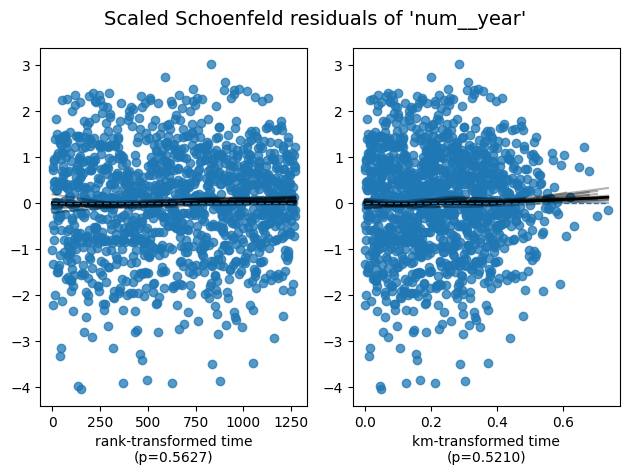

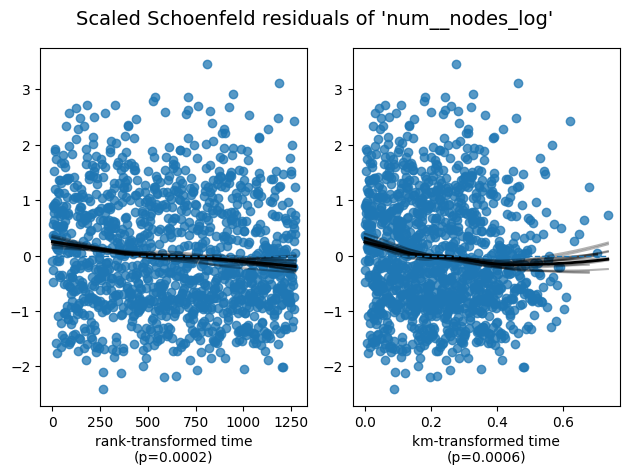

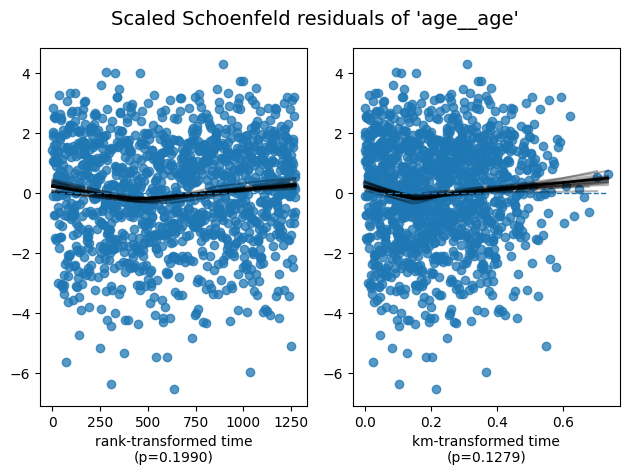

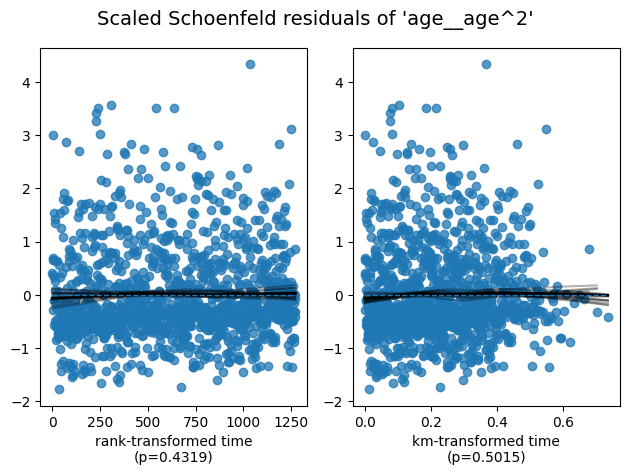

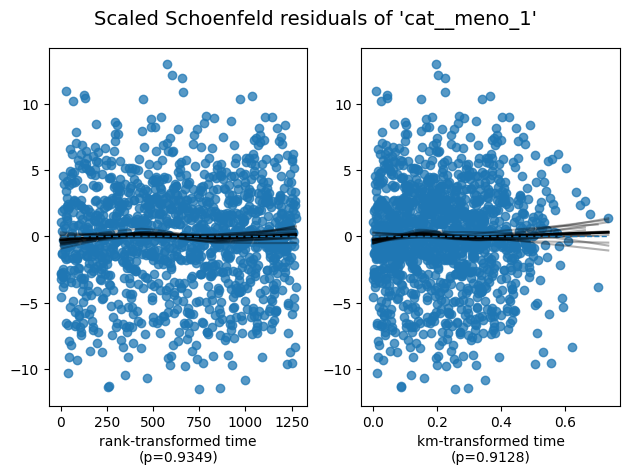

...

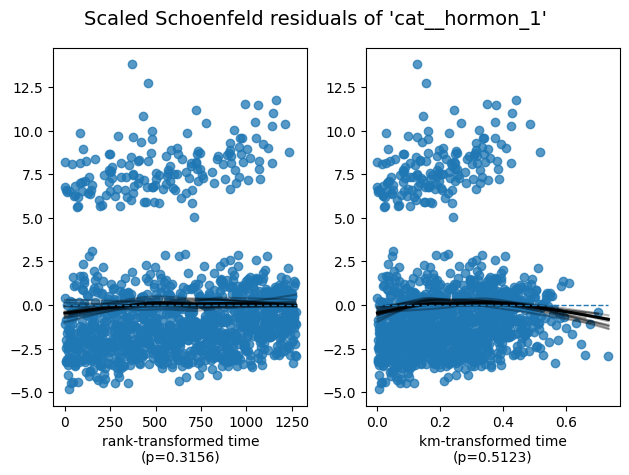

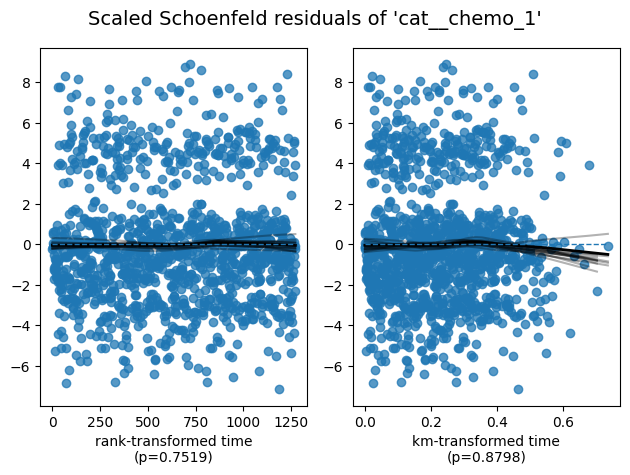

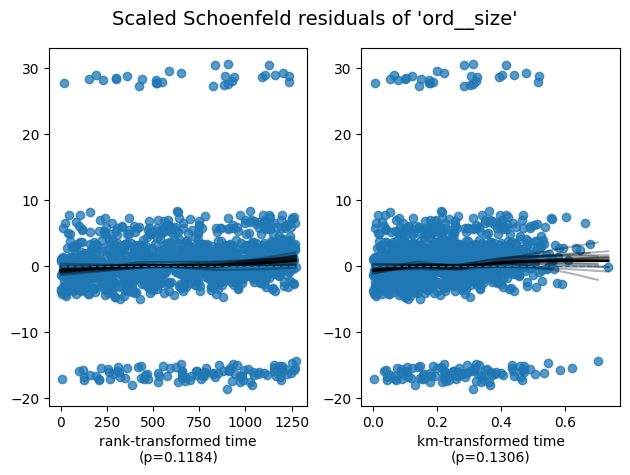

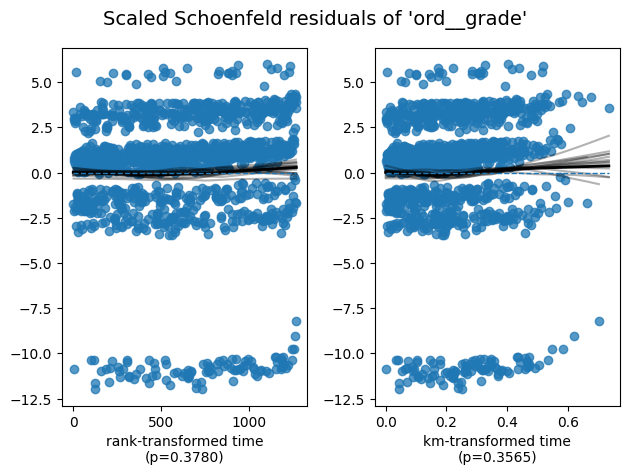

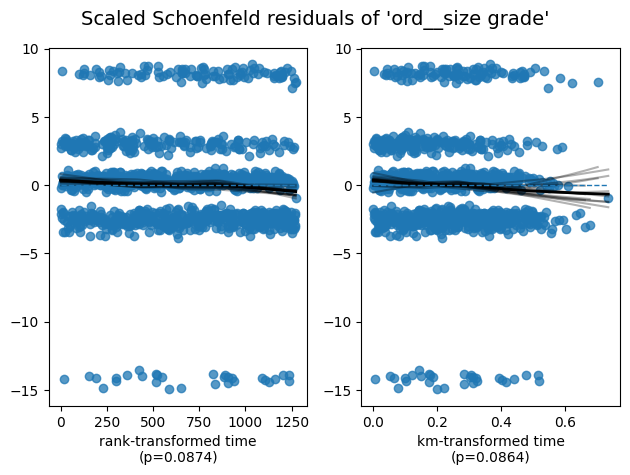

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox,
    p_value_threshold=0.05,
    show_plots=True
)

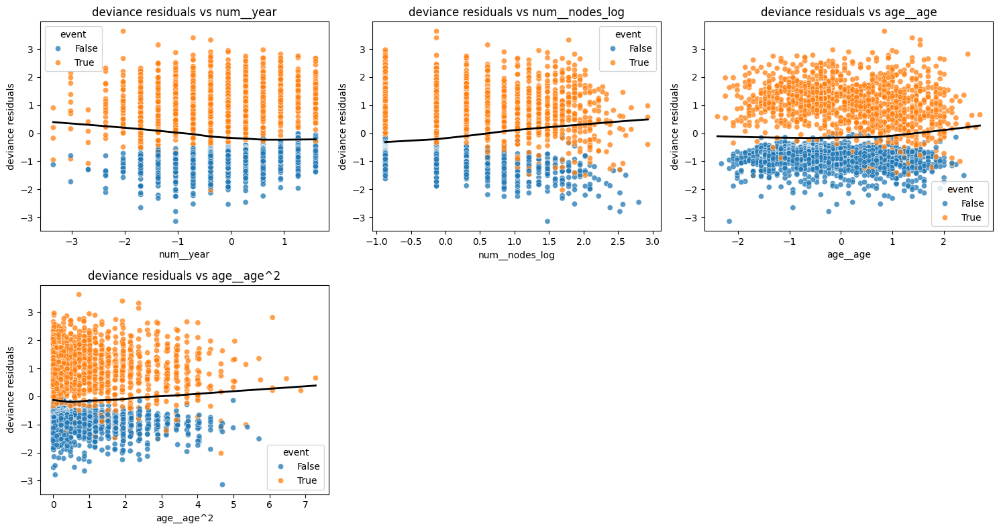

In [ ]:
# assumptions check: Deviance residuals
num_vars_cox = ['num__year', 'num__nodes_log', 'age__age', 'age__age^2']

dev_resid = cph_baseline_fe.compute_residuals(df_cox, kind="deviance")
residuals_plot(df_cox, dev_resid, num_vars_cox, ncols=3)

Diagnostic tests and residual plots indicated violations of the proportional hazards assumption for several covariates, most notably `num__nodes_log`, `cat__er_pos_1`, `cat__pgr_pos_1` and `num__year`.
These findings motivated further model refinement.

Strategies to improve the model:
1. Stratification by `cat__er_pos_1` and `cat__pgr_pos_1`.
2. Adding interaction of `num__year` or `num__nodes_log` with time variable.

In [ ]:
# model with stratification by cat__pgr_pos_1 and cat__er_pos_1
cph_baseline_fe = fit_cox(df_cox, strata=['cat__er_pos_1', 'cat__pgr_pos_1'])

# model evaluation
print('Cox model - Stratification by cat__er_pos_1 and cat__pgr_pos_1')
evaluate_cox_model(cph_baseline_fe)

Cox model - Stratification by cat__er_pos_1 and cat__pgr_pos_1


{'c_index': np.float64(0.7187208732288503),
 'log_likelihood': np.float64(-7848.785270941067),
 'aic': np.float64(15717.570541882134)}

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox,
    p_value_threshold=0.05,
    show_plots=False
)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__nodes_log' failed the non-proportional test: p-value is 0.0007.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__nodes_log' using pd.cut, and then specify it in
`strata=['num__nodes_log', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


---
[A]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html
[B]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Bin-variable-and-stratify-on-it
[C]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20h

[]

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


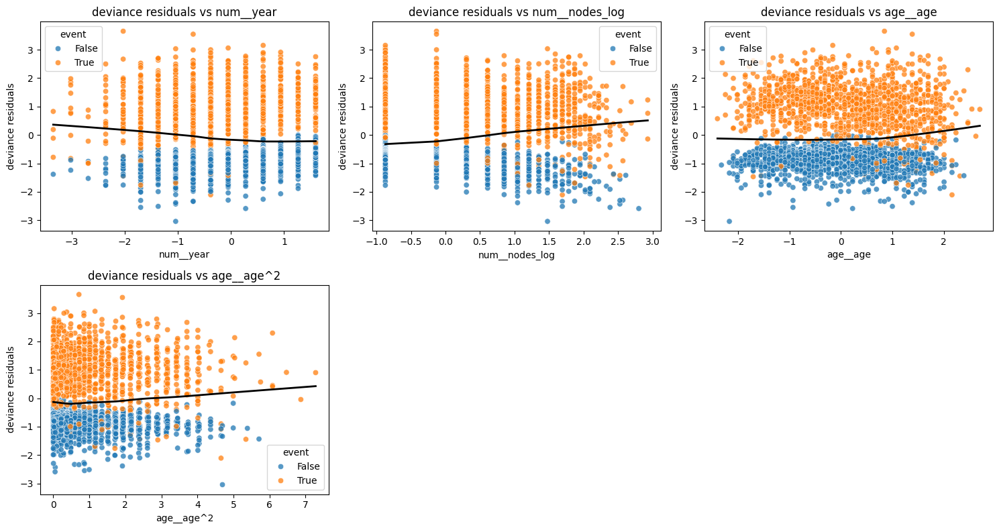

In [ ]:
# assumptions check: Deviance residuals
dev_resid = cph_baseline_fe.compute_residuals(df_cox, kind="deviance")
residuals_plot(df_cox, dev_resid, num_vars_cox, ncols=3)

Stratification by progesterone receptor status and estrogen receptor status substantially improved model fit, as reflected by a marked increase in log-likelihood and a reduction in AIC. This suggests distinct baseline hazard functions across progesterone receptor strata. Accordingly, this stratified model was retained for further evaluation.

Time-varying effects will be subsequently evaluated for selected covariates.

In [ ]:
# time-varying effect for nodes_log
df_cox_nodes_interaction = df_cox.copy()
df_cox_nodes_interaction["nodes_log_x_logtime"] = (
    df_cox_nodes_interaction["num__nodes_log"] * np.log(df_cox_nodes_interaction['time'])
)

In [ ]:
# model fitting
cph_baseline_fe = fit_cox(df_cox_nodes_interaction, strata=['cat__er_pos_1', 'cat__pgr_pos_1'])

# model evaluation
print('Cox model - Stratification by cat__er_pos_1-cat__pgr_pos_1 and nodes_log x time interaction')
evaluate_cox_model(cph_baseline_fe)

Cox model - Stratification by cat__er_pos_1-cat__pgr_pos_1 and nodes_log x time interaction


{'c_index': np.float64(0.6626148458409942),
 'log_likelihood': np.float64(-7984.865755561081),
 'aic': np.float64(15991.731511122161)}

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox_nodes_interaction,
    p_value_threshold=0.05,
    show_plots=False
)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__nodes_log' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__nodes_log' using pd.cut, and then specify it in
`strata=['num__nodes_log', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


2. Variable 'cat__hormon_1' failed the non-proportional test: p-value is 0.0320.

   Advice: with so few unique values (only 2), you can include `strata=['cat__hormon_1', ...]` in
the call in `.fit`. See documentation in link [E] below.

3. Variable 'cat__chemo_1' failed the non-proportional test: p-value is 0.0167.

   Advice: 

[]

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


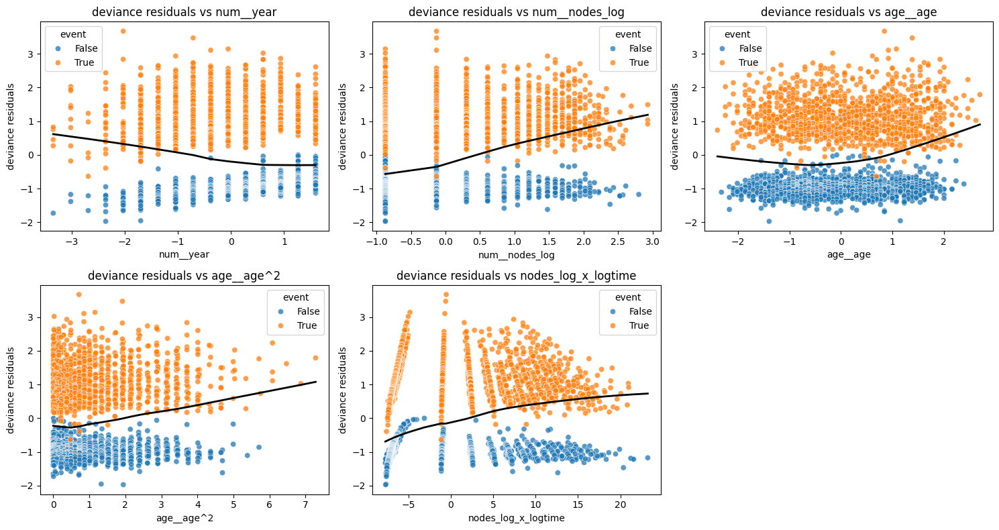

In [ ]:
# assumptions check: Deviance residuals
num_vars_cox_nodes_interaction = num_vars_cox + ['nodes_log_x_logtime']
dev_resid = cph_baseline_fe.compute_residuals(df_cox_nodes_interaction, kind="deviance")
residuals_plot(df_cox_nodes_interaction, dev_resid, num_vars_cox_nodes_interaction, ncols=3)

We further explored time-dependent effects by introducing an interaction between the number of positive lymph nodes and time.

This modification resulted in a marked decrease in concordance index and worsened diagnostic plots, with additional violations of the proportional hazards assumption.

These results suggest that the introduced time interaction added unnecessary complexity without improving model performance or adequacy.

In [ ]:
# time-varying effect for nodes_log
df_cox_year_interaction = df_cox.copy()
df_cox_year_interaction["year_x_logtime"] = (
    df_cox_year_interaction["num__year"] * np.log(df_cox_year_interaction['time'])
)

In [ ]:
# model fitting
cph_baseline_fe = fit_cox(df_cox_year_interaction, strata=['cat__er_pos_1', 'cat__pgr_pos_1'])

# model evaluation
print('Cox model - Stratification by cat__er_pos_1-cat__pgr_pos_1 and year x time interaction')
evaluate_cox_model(cph_baseline_fe)

Cox model - Stratification by cat__er_pos_1-cat__pgr_pos_1 and year x time interaction


{'c_index': np.float64(0.7330542150700978),
 'log_likelihood': np.float64(-7890.273681010896),
 'aic': np.float64(15802.547362021793)}

In [ ]:
# assumptions check: Schoenfeld residuals
cph_baseline_fe.check_assumptions(
    df_cox_year_interaction,
    p_value_threshold=0.05,
    show_plots=False
)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'num__year' failed the non-proportional test: p-value is 0.0008.

   Advice 1: the functional form of the variable 'num__year' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'num__year' using pd.cut, and then specify it in
`strata=['num__year', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


2. Variable 'num__nodes_log' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'num__nodes_log' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to spec

[]

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


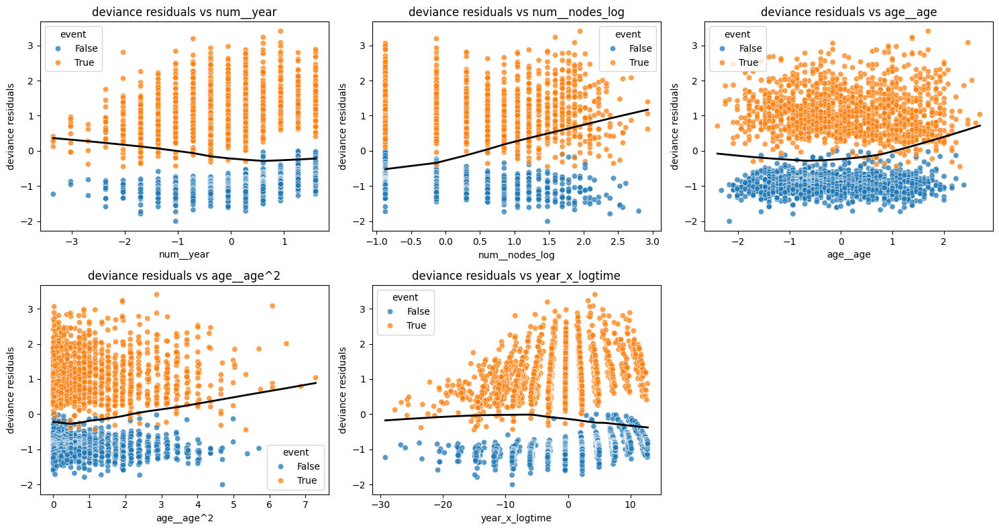

In [ ]:
# assumptions check: Deviance residuals
num_vars_cox_year_interaction = num_vars_cox + ['year_x_logtime']
dev_resid = cph_baseline_fe.compute_residuals(df_cox_year_interaction, kind="deviance")
residuals_plot(df_cox_year_interaction, dev_resid, num_vars_cox_year_interaction, ncols=3)

Finally, we evaluated a model incorporating a time-dependent effect of calendar year of surgery.
While this specification improved concordance index and information criteria, it introduced new violations of the proportional hazards assumption and worsened deviance residual patterns for multiple covariates.

Given the increased model complexity and reduced assumption validity, this approach was not pursued further.

The stratified model without time interactions was therefore selected as the final model for overall survival.

In summary, a Cox proportional hazards model with feature-engineered covariates and stratification by ER and PGR status provided the best balance between model fit, discriminative ability, and assumption validity for overall survival.

More complex extensions involving time-dependent effects did not yield consistent improvements and were associated with increased assumption violations.

Therefore, the stratified Cox model was selected as the final model for inference.

### 5.5.7 Hazard Ratio Interpretation

,coef,HR,HR_lower_95,HR_upper_95,p
covariate,,,,,
ord__size,0.6412,1.8988,1.2930,2.7886,0.0011
num__nodes_log,0.5435,1.7221,1.6225,1.8278,0.0000
ord__grade,0.4652,1.5924,1.2928,1.9613,0.0000
age__age^2,0.1832,1.2011,1.1444,1.2606,0.0000
cat__meno_1,0.1794,1.1965,0.9633,1.4862,0.1047
age__age,0.0331,1.0336,0.9379,1.1391,0.5048
num__year,-0.0682,0.9340,0.8783,0.9933,0.0296
ord__size grade,-0.2050,0.8146,0.6627,1.0014,0.0516
cat__hormon_1,-0.2105,0.8101,0.6724,0.9761,0.0268


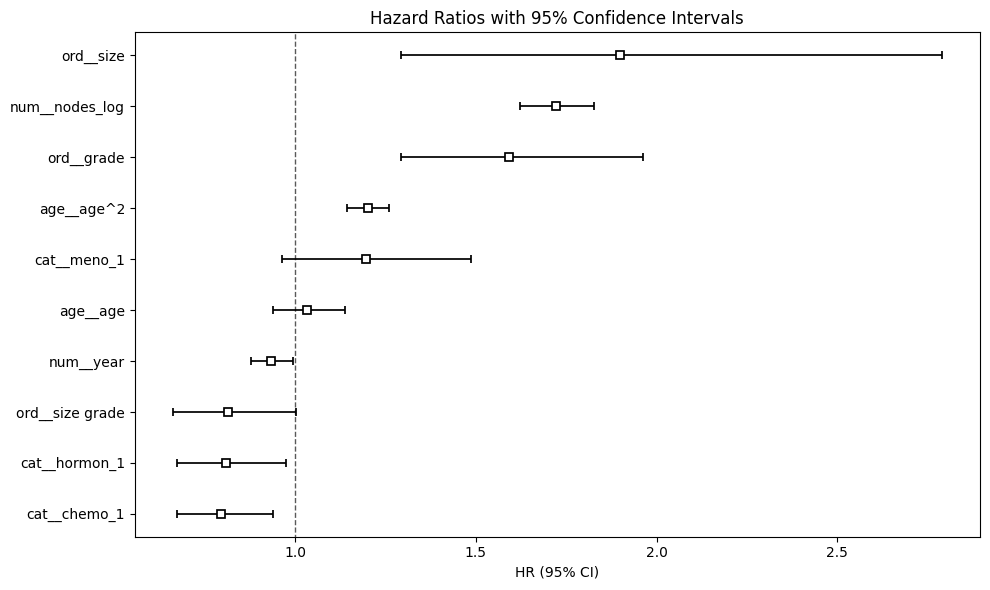

In [ ]:
cph_baseline_fe = fit_cox(df_cox, strata=['cat__er_pos_1', 'cat__pgr_pos_1'])
hr_df_plot(cph_baseline_fe)

The final Cox proportional hazards model for overall survival was stratified by ER and PGR status and included feature-engineered covariates. Hazard ratios (HRs) are interpreted conditional on the baseline hazard within each stratum.

* Tumor size was a strong predictor of mortality, with larger tumor categories associated with an increased hazard of death.

* Higher number of positive lymph nodes was associated with substantially worse overall survival, highlighting nodal involvement as one of the most important prognostic factors.

* Higher tumor grade was also associated with increased mortality risk, consistent with the more aggressive biology of poorly differentiated tumors.

* Age exhibited a nonlinear association with mortality. While the linear age term was not statistically significant, the quadratic age term was strongly associated with increased hazard, suggesting that mortality risk accelerates at older ages rather than increasing linearly.

* Calendar year of surgery showed a protective effect, with more recent years associated with reduced mortality. This finding likely reflects improvements in diagnostic practices, systemic therapies, and overall standards of oncological care over time.

* Adjuvant treatments were associated with improved survival. Hormonal therapy was linked to a lower hazard of death, as was chemotherapy, consistent with their established survival benefits in breast cancer management.

* Menopausal status and the interaction between tumor size and grade showed weaker and borderline associations with mortality and did not reach conventional levels of statistical significance.

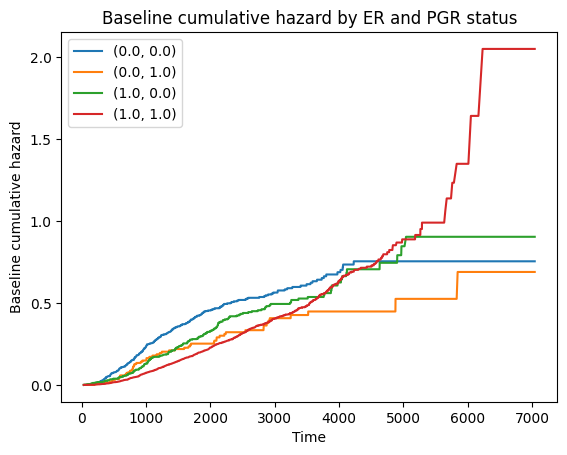

In [ ]:
# Baseline cumulative hazard by ER and PGR status
cph_baseline_fe.baseline_cumulative_hazard_.plot()
plt.title("Baseline cumulative hazard by ER and PGR status")
plt.xlabel("Time")
plt.ylabel("Baseline cumulative hazard")
plt.show()

The model was stratified by estrogen receptor (ER) and progesterone receptor (PGR) status. Baseline hazards were similar across strata during early follow-up but diverged after approximately 5000 days. In particular, ER/PGR-positive patients exhibited increasing late mortality risk, whereas baseline hazards for other receptor groups tended to plateau.

This pattern is consistent with known long-term disease dynamics of hormone receptor-positive breast cancer and supports the use of stratification to capture heterogeneous baseline risk over extended follow-up.

## 5.6 Comparison Between RFS and OS Results

Both RFS and OS were adequately modeled using Cox proportional hazards models, with RFS consistently showing slightly higher concordance index values.

Tumor burden variables (tumor size, nodal involvement, and grade) were strong and consistent predictors for both endpoints. Calendar year of surgery was protective in both analyses, reflecting improvements in breast cancer management over time.

Treatment variables were protective in both models, but their effects were more pronounced and estimated with greater precision in RFS than in OS. In OS, confidence intervals were wider and closer to unity, consistent with the influence of competing risks and non-cancer mortality on overall survival.

Age showed a stronger and nonlinear association with OS, whereas its effect on recurrence was weaker. Violations of proportional hazards were more prominent in OS, necessitating stratification by hormone receptor status to capture differing long-term risk trajectories.

Overall, RFS primarily reflected tumor biology and early treatment response, while OS integrated broader long-term clinical and demographic factors.

# 6. Causal Inference Analysis

## 6.1 Causal Question and Target Estimand

Causal question:
What is the causal effect of adjuvant hormonal therapy (`hormon` = 1 vs 0) on patient outcomes?

Outcomes of interest:
* Tumor recurrence (`recur`)
* Overall mortality (`death`)

The goal of this analysis is causal inference rather than prediction.
Specifically, we aim to estimate the Average Treatment Effect (ATE) of hormonal therapy, defined as the average difference in outcomes that would be observed if all patients in the study population received hormonal therapy compared to if none of them did.

This estimand reflects a population-level causal effect under a hypothetical intervention assigning hormonal therapy to all eligible patients.

## 6.2 Causal Assumptions and Conceptual Framework

Because treatment assignment is not randomized, causal inference relies on several key assumptions.

First, we assume conditional exchangeability: given a sufficient set of observed covariates, treatment assignment is independent of the potential outcomes. In other words, after adjustment for measured confounders, there are no unobserved factors that simultaneously affect treatment assignment and outcomes.

Second, we assume positivity: for all relevant combinations of covariates, patients have a non-zero probability of receiving and not receiving hormonal therapy. This assumption is explicitly assessed in the propensity score analysis and motivates the use of trimming to improve overlap.

Third, we assume consistency: each patient’s observed outcome under the received treatment corresponds to their potential outcome under that treatment.

Potential confounders include demographic characteristics, tumor severity indicators, hormone receptor status, and other treatments, which may influence both the likelihood of receiving hormonal therapy and patient outcomes.

## 6.3 Confounder Selection and Data Preparation

The set of confounders was defined a priori based on clinical relevance and prior knowledge, and includes demographic variables, tumor characteristics, biomarkers, and additional treatments (see Section 3.9 Final List of Covariates for Each Model).

Data preprocessing steps (including transformations and encoding of variables) were applied consistently with earlier parts of the analysis and reused for the causal models to ensure comparability.

No missing values were present in the dataset.

## 6.4 Baseline Imbalance Between Treatment Groups

Patients receiving and not receiving hormonal therapy differ substantially in baseline characteristics, reflecting non-random treatment assignment (see Section 2.4.1 Stratification by Hormonal Therapy).

This imbalance provides strong motivation for the use of causal inference methods, such as propensity score-based adjustment and outcome regression, to reduce confounding and approximate a randomized comparison between treatment groups.

## 6.5 Inverse Probability of Treatment Weighting (IPTW)

In [ ]:
def propensity_score_hist(df, treatment_col='hormon', propensity_score_col='propensity_score'):
    """
    Histogram of Propensity Scores by treatment groups
    """
    # Separate propensity scores by treatment group
    ps_treated = df.loc[df[treatment_col] == 1, propensity_score_col]
    ps_untreated = df.loc[df[treatment_col] == 0, propensity_score_col]

    # Plot histograms
    plt.figure(figsize=(8, 5))
    plt.hist(ps_treated, bins=30, alpha=0.6, label=f'{treatment_col} = 1')
    plt.hist(ps_untreated, bins=30, alpha=0.6, label=f'{treatment_col} = 0')

    plt.xlabel('Propensity score')
    plt.ylabel('Count')
    plt.title('Propensity Score Distributions')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
def iptw_stabilized(df, treatment_col='hormon', propensity_score_col='propensity_score'):
    """
    Compute IPTW Stabilized and add it as column to a dataframe
    """
    # Treatment prevalence
    p_treated = df[treatment_col].mean()
    p_untreated = 1 - p_treated

    # Stabilized IPTW
    df['iptw_stabilized'] = np.where(
        df[treatment_col] == 1,  # For treated
        p_treated / df[propensity_score_col],
        p_untreated / (1 - df[propensity_score_col]))  # For untreated

In [ ]:
def standardized_mean_difference(x, treatment, weights=None):
    """
    Compute SMD in treated and control groups per each variable
    """
    treated = treatment == 1
    control = treatment == 0

    if weights is None:
        mean_t = np.mean(x[treated])
        mean_c = np.mean(x[control])
        sd = np.sqrt((np.var(x[treated], ddof=1) + np.var(x[control], ddof=1)) / 2)
    else:
        mean_t = np.average(x[treated], weights=weights[treated])
        mean_c = np.average(x[control], weights=weights[control])
        var_t = np.average((x[treated] - mean_t)**2, weights=weights[treated])
        var_c = np.average((x[control] - mean_c)**2, weights=weights[control])
        sd = np.sqrt((var_t + var_c) / 2)

    return (mean_t - mean_c) / sd

In [ ]:
def smd_table(df, X, treatment_col='hormon'):
    """
    Create table with SMD before and after
    applying IPTW per each confounder
    """
    confounders = X.columns

    smd_before = {}
    smd_after = {}

    for col in confounders:
        x = X[col].values
        t = df[treatment_col].values
        w = df['iptw_stabilized'].values

        smd_before[col] = standardized_mean_difference(x, t)
        smd_after[col] = standardized_mean_difference(x, t, weights=w)

    smd_df = (
        pd.DataFrame({
            'SMD_before_IPTW': smd_before,
            'SMD_after_IPTW': smd_after
        })
        .sort_values(by='SMD_before_IPTW', key=np.abs, ascending=False)
    )

    return smd_df

### 6.5.1 Propensity Score Estimation

In [ ]:
# removing hormon from predictors
cat_features_no_hormon = cat_features.copy()
cat_features_no_hormon.remove(treatment_vars[1])

X = df[num_features + cat_features_no_hormon + ord_features]
y_hormon = df[treatment_vars[1]]

# data preprocessor for
# propensity scores estimation
preprocessor_ps = build_preprocessor(
    num_features=num_features,
    cat_features=cat_features_no_hormon,
    ord_features=ord_features
)

X_processed = preprocessor_ps.fit_transform(X)
X_processed = pd.DataFrame(
    X_processed,
    columns=preprocessor_ps.get_feature_names_out(),
    index=X.index
)

# Fit the logistic regression model
ps_model = LogisticRegression(
    solver='liblinear', # works good for relatively small dataset in binary classification models
    max_iter=1000,
    random_state=RANDOM_STATE
    )

ps_model.fit(X_processed, y_hormon)

# Add propensity scores to the dataset
df_ps = df.assign(propensity_score=ps_model.predict_proba(X_processed)[:, 1])

The propensity score was estimated using logistic regression, modeling the
probability of receiving hormonal therapy conditional on observed confounders.

Model performance was not evaluated in predictive terms, as the goal of the
propensity score is covariate balance rather than treatment prediction.

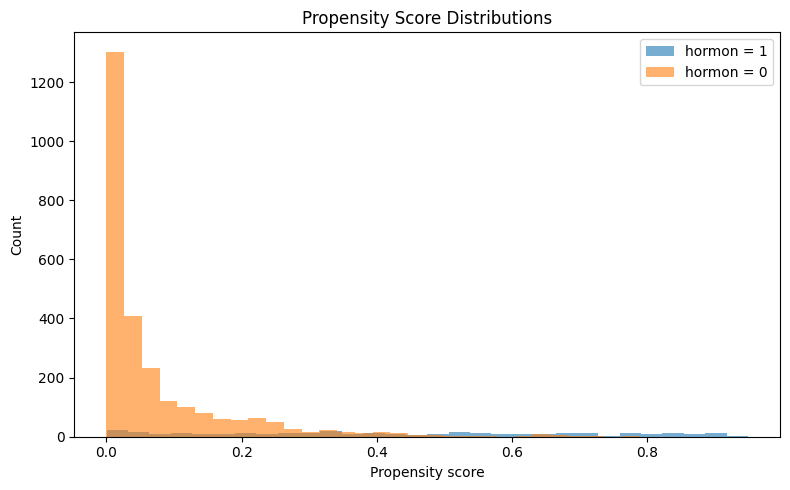

In [ ]:
propensity_score_hist(df_ps)

The proportion of patients receiving hormonal therapy was relatively small (11.4%), resulting in a skewed propensity score distribution with many untreated patients having scores close to zero.

This pattern reflects non-random treatment assignment and is expected in the presence of confounding by indication.

To improve the stability of the weights, stabilized inverse probability weights will be used in subsequent analyses.

In [ ]:
iptw_stabilized(df_ps)
# Quick check
df_ps['iptw_stabilized'].describe()

,iptw_stabilized
count,"2,982.0000"
mean,1.3185
std,8.8629
min,0.1198
25%,0.8905
50%,0.9066
75%,0.9633
max,343.8874


In [ ]:
smd_table(df_ps, X_processed)

,SMD_before_IPTW,SMD_after_IPTW
num__nodes_log,1.2012,0.3252
cat__meno_1,0.8527,-0.9232
num__year,0.8297,-1.3753
num__age,0.7314,-0.9486
ord__size,0.4072,0.4227
cat__chemo_1,-0.3635,1.8073
ord__grade,0.2505,-0.3520
cat__pgr_pos_1,-0.2016,0.0490
cat__er_pos_1,0.0478,-0.1063


Large values of IPTW were observed (max=343,9). Patients in hormon=0 and hormon=1 groups are not balanced even after applying IPTW (SMD > 0.2 in many variables).

We will use Crump and Stürmer trimming methods to reduce IPTW coefficients and achieve proper balance.

### 6.5.2 Trimming (Crump Criterion)

Trim data using Crump

In [ ]:
lower_cut, upper_cut = 0.1, 0.9

trimmed_df = df_ps[
    (df_ps['propensity_score'] > lower_cut) &
    (df_ps['propensity_score'] < upper_cut)
].copy()

In [ ]:
# Refit PS model on trimmed_df
X_trim = trimmed_df[num_features + cat_features_no_hormon + ord_features]
y_trim = trimmed_df[treatment_vars[1]]

X_trim_processed = preprocessor_ps.fit_transform(X_trim)
X_trim_processed = pd.DataFrame(
    X_trim_processed,
    columns=preprocessor_ps.get_feature_names_out(),
    index=X_trim.index
)

ps_model.fit(X_trim_processed, y_trim)

trimmed_df['propensity_score'] = ps_model.predict_proba(X_trim_processed)[:, 1]

# stabilized weights after trimming
iptw_stabilized(trimmed_df)
# Quick check
trimmed_df['iptw_stabilized'].describe()

,iptw_stabilized
count,893.0000
mean,0.9781
std,1.0270
min,0.3244
25%,0.7186
50%,0.7901
75%,0.9751
max,16.3823


In [ ]:
smd_table(trimmed_df, X_trim_processed)

,SMD_before_IPTW,SMD_after_IPTW
num__year,0.5609,-0.1533
cat__chemo_1,-0.4776,0.0395
cat__meno_1,0.3390,0.2666
num__nodes_log,0.3137,0.1118
num__age,0.2410,0.0458
cat__pgr_pos_1,-0.2159,-0.0329
ord__grade,0.1640,0.0575
ord__size,0.1245,0.0475
cat__er_pos_1,-0.0866,-0.0916


In [ ]:
print('Number of records left after trimming:', len(trimmed_df))
print('Percentage of deleted records:', round((1-(len(trimmed_df)/len(df)))*100, 2))
print('Proportion of treated/control groups after trimming:')
display(trimmed_df[treatment_vars[1]].value_counts(normalize=True))

Number of records left after trimming: 893
Percentage of deleted records: 70.05
Proportion of treated/control groups after trimming:


,proportion
hormon,
0,0.6853
1,0.3147


### 6.5.3 Trimming (Stürmer Criterion)

Trim data using Stürmer

In [ ]:
# percentiles among treated and untreated
ps_treated = df_ps.loc[df_ps[treatment_vars[1]] == 1, 'propensity_score']
ps_untreated = df_ps.loc[df_ps[treatment_vars[1]] == 0, 'propensity_score']

lower_sturmer = ps_treated.quantile(0.05)
upper_sturmer = ps_untreated.quantile(0.95)

sturmer_trimmed_df = df_ps[
    (df_ps['propensity_score'] > lower_sturmer) &
    (df_ps['propensity_score'] < upper_sturmer)
].copy()

In [ ]:
# Refit PS model on sturmer_trimmed_df
X_trim = sturmer_trimmed_df[num_features + cat_features_no_hormon + ord_features]
y_trim = sturmer_trimmed_df[treatment_vars[1]]

X_trim_processed = preprocessor_ps.fit_transform(X_trim)
X_trim_processed = pd.DataFrame(
    X_trim_processed,
    columns=preprocessor_ps.get_feature_names_out(),
    index=X_trim.index
)

ps_model.fit(X_trim_processed, y_trim)

sturmer_trimmed_df['propensity_score'] = ps_model.predict_proba(X_trim_processed)[:, 1]

# stabilized weights after trimming
iptw_stabilized(sturmer_trimmed_df)
# Quick check
sturmer_trimmed_df['iptw_stabilized'].describe()

,iptw_stabilized
count,"1,671.0000"
mean,0.9892
std,0.1842
min,0.2148
25%,0.9560
50%,0.9740
75%,1.0221
max,3.6749


In [ ]:
smd_table(sturmer_trimmed_df, X_trim_processed)

,SMD_before_IPTW,SMD_after_IPTW
num__nodes_log,0.7543,0.5843
cat__meno_1,0.3447,0.0470
ord__size,0.3002,0.0813
num__age,0.1961,-0.0521
ord__grade,0.1840,0.1219
num__year,-0.1316,-0.1776
cat__pgr_pos_1,0.1195,0.0308
cat__chemo_1,-0.1047,0.3359
cat__er_pos_1,0.0655,0.1095


In [ ]:
print('Number of records left after trimming:', len(sturmer_trimmed_df))
print('Percentage of deleted records:', round((1-(len(sturmer_trimmed_df)/len(df)))*100, 2))
print('Proportion of treated/control groups after trimming:')
display(sturmer_trimmed_df['hormon'].value_counts(normalize=True))

Number of records left after trimming: 1671
Percentage of deleted records: 43.96
Proportion of treated/control groups after trimming:


,proportion
hormon,
0,0.9366
1,0.0634


Stürmer trimming was selected as a compromise between covariate balance and
population representativeness. While Crump trimming achieved near-perfect
balance, it resulted in substantial data loss and a marked change in treatment
prevalence, restricting inference to a narrow subset of patients.

Stürmer trimming preserved a larger portion of the original cohort while
substantially improving covariate balance, allowing estimation of treatment
effects in a clinically more representative population with adequate overlap.

Despite trimming, some residual imbalance remained for key clinical variables
(e.g., number of positive lymph nodes and chemotherapy use), indicating that
IPTW-based estimates may still be sensitive to unmeasured or inadequately
adjusted confounding.

### 6.5.4 Estimation of the Average Treatment Effect Using IPTW

In [ ]:
X = sm.add_constant(sturmer_trimmed_df[treatment_vars[1]])

y_recur = sturmer_trimmed_df[target_vars[0]]

# predicting recur based on treatment variable using weights iptw_stabilized
model = sm.WLS(y_recur, X, weights=sturmer_trimmed_df['iptw_stabilized'])
res = model.fit(cov_type='HC3')
print(res.summary())

                            WLS Regression Results                            
Dep. Variable:                  recur   R-squared:                       0.001
Model:                            WLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.311
Date:                Thu, 05 Feb 2026   Prob (F-statistic):              0.252
Time:                        22:36:10   Log-Likelihood:                -1226.6
No. Observations:                1671   AIC:                             2457.
Df Residuals:                    1669   BIC:                             2468.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4963      0.013     39.150      0.0

Using stabilized IPTW after Stürmer trimming, hormonal therapy was associated with a lower risk of recurrence (ATE = -0.076), although the effect was not statistically significant (95% CI: -0.205 to 0.054). The wide confidence interval reflects substantial uncertainty, likely due to limited overlap and the small proportion of treated patients after trimming. While the point estimate suggests a protective effect, the data do not provide strong statistical evidence to conclusively support a causal effect of hormonal therapy on recurrence.

In [ ]:
X = sm.add_constant(sturmer_trimmed_df[treatment_vars[1]])

y_death = sturmer_trimmed_df[target_vars[1]]

# predicting death based on treatment variable using weights iptw_stabilized
model = sm.WLS(y_death, X, weights=sturmer_trimmed_df['iptw_stabilized'])
res = model.fit(cov_type='HC3')
print(res.summary())

                            WLS Regression Results                            
Dep. Variable:                  death   R-squared:                       0.000
Model:                            WLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.5091
Date:                Thu, 05 Feb 2026   Prob (F-statistic):              0.476
Time:                        22:36:10   Log-Likelihood:                -1202.2
No. Observations:                1671   AIC:                             2408.
Df Residuals:                    1669   BIC:                             2419.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4114      0.013     32.848      0.0

Using stabilized IPTW after Stürmer trimming, hormonal therapy was associated with a slightly higher estimated risk of death (ATE = 0.047), although this effect was not statistically significant (95% CI: -0.082 to 0.176). The wide confidence interval indicates substantial uncertainty, and the data do not provide strong evidence of a causal effect of hormonal therapy on mortality in the overlap population.

## 6.6 Outcome Regression as an Alternative Causal Estimator

Outcome regression was used as an alternative causal estimator relying on correct specification of the outcome model rather than the treatment model.

In [ ]:
def ate_or(model, X, treatment_col='hormon'):
    """
    Compute ATE using Outcome regression model
    """
    X1 = X.copy()
    X0 = X.copy()

    X1[treatment_col] = 1
    X0[treatment_col] = 0

    X1_transformed = preprocessor_or.transform(X1)
    X0_transformed = preprocessor_or.transform(X0)

    X1_transformed = sm.add_constant(X1_transformed, has_constant='add')
    X0_transformed = sm.add_constant(X0_transformed, has_constant='add')

    # predicted probabilities
    y1_hat = model.predict(X1_transformed)
    y0_hat = model.predict(X0_transformed)

    ate_or = np.mean(y1_hat - y0_hat)
    return ate_or

In [ ]:
def ate_or_ci(df, var_list, target_col, treatment_col='hormon', range_num=1000):
    """
    Compute CI for ATE using Outcome regression model
    """
    ates = []

    for _ in range(range_num):
        boot = resample(df, replace=True)
        Xb = boot[var_list]
        Xb_transformed = preprocessor_or.transform(Xb)
        Xb_transformed = sm.add_constant(Xb_transformed)
        yb = boot[target_col].values

        model_b = sm.Logit(yb, Xb_transformed).fit(disp=False)

        ates.append(ate_or(model_b, Xb, treatment_col=treatment_col))

    ci_low, ci_high = np.percentile(ates, [2.5, 97.5])

    print(f"95% CI: [{ci_low:.4f}, {ci_high:.4f}]")

### 6.6.1 Causal Effect of Hormonal Therapy on Tumor Recurrence

In [ ]:
X = df[num_features + cat_features + ord_features]
y_recur = df[target_vars[0]]

preprocessor_or = build_preprocessor(
    num_features=num_features,
    cat_features=cat_features,
    ord_features=ord_features
)

X_transformed = preprocessor_or.fit_transform(X)
y_recur = y_recur.values

X_transformed = sm.add_constant(X_transformed)

logit_model_or = sm.Logit(y_recur, X_transformed).fit(disp=False)
print(logit_model_or.summary())

                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 2982
Model:                          Logit   Df Residuals:                     2971
Method:                           MLE   Df Model:                           10
Date:                Thu, 05 Feb 2026   Pseudo R-squ.:                  0.1084
Time:                        22:36:10   Log-Likelihood:                -1842.7
converged:                       True   LL-Null:                       -2066.7
Covariance Type:            nonrobust   LLR p-value:                 5.107e-90
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.0111      0.213     -4.758      0.000      -1.428      -0.595
x1            -0.3730      0.070     -5.339      0.000      -0.510      -0.236
x2             0.0087      0.042      0.206      0.8

In [ ]:
print(f"ATE (Outcome regression): {ate_or(logit_model_or, X)}")

ATE (Outcome regression): -0.14834206604556352


In [ ]:
ate_or_ci(df, num_features + cat_features + ord_features, target_col=target_vars[0])

95% CI: [-0.2013, -0.0922]


Outcome regression analysis suggests a substantial protective effect of hormonal therapy on recurrence, with an estimated average treatment effect of -0.15 (95% CI: -0.20 to -0.09). This result indicates a lower risk of
recurrence among treated patients after adjustment for observed covariates.

### 6.6.2 Causal Effect of Hormonal Therapy on Mortality

In [ ]:
X = df[num_features + cat_features + ord_features]
y_death = df[target_vars[1]]

preprocessor_or = build_preprocessor(
    num_features=num_features,
    cat_features=cat_features,
    ord_features=ord_features
)

X_transformed = preprocessor_or.fit_transform(X)
y_death = y_death.values

X_transformed = sm.add_constant(X_transformed)

logit_model_or = sm.Logit(y_death, X_transformed).fit(disp=False)
print(logit_model_or.summary())

                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 2982
Model:                          Logit   Df Residuals:                     2971
Method:                           MLE   Df Model:                           10
Date:                Thu, 05 Feb 2026   Pseudo R-squ.:                  0.1729
Time:                        22:37:21   Log-Likelihood:                -1682.9
converged:                       True   LL-Null:                       -2034.7
Covariance Type:            nonrobust   LLR p-value:                1.044e-144
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.9711      0.228     -4.255      0.000      -1.418      -0.524
x1             0.1433      0.073      1.960      0.050    2.17e-05       0.287
x2            -0.5185      0.046    -11.335      0.0

In [ ]:
print(f"ATE (Outcome regression): {ate_or(logit_model_or, X)}")

ATE (Outcome regression): -0.10105616240856519


In [ ]:
ate_or_ci(df, num_features + cat_features + ord_features, target_col=target_vars[1])

95% CI: [-0.1500, -0.0534]


A protective effect of hormonal therapy on mortality was also observed (ATE = -0.10, 95% CI: -0.15 to -0.05), although the magnitude of the effect was smaller compared to recurrence.

These estimates rely on the assumption that all relevant confounders are observed and that the outcome model is correctly specified.

## 6.7 Comparison of Causal Effect Estimates Across Methods

To assess the robustness of the estimated causal effects, we compared results obtained using two different causal inference approaches: inverse probability of treatment weighting (IPTW) with trimming and outcome regression.

For tumor recurrence, outcome regression suggested a substantial protective effect of hormonal therapy, with a larger magnitude compared to IPTW-based estimates. In contrast, IPTW combined with trimming resulted in smaller and statistically non-significant effects.

A similar pattern was observed for mortality. Outcome regression indicated a protective effect of hormonal therapy, whereas IPTW-based estimates were closer to zero and not statistically significant.

These differences reflect the distinct assumptions underlying each method. Outcome regression relies on correct specification of the outcome model and may extrapolate effects to regions with limited treatment overlap. In contrast, IPTW focuses on creating a pseudo-population with balanced covariates and is more sensitive to limited overlap and extreme propensity scores, particularly in the presence of strong treatment imbalance.

Overall, IPTW provides more conservative estimates that are less reliant on parametric modeling assumptions but may suffer from reduced effective sample size after trimming. Outcome regression yields more precise estimates but may be more sensitive to model misspecification and unmeasured confounding.

Taken together, the results suggest that evidence for a protective effect of hormonal therapy is stronger under outcome regression assumptions, while IPTW highlights substantial uncertainty due to limited overlap and treatment imbalance in the data.